# [HSP]: Notebook 1 - Exploratory Data Analysis (EDA)

## 1. Healtcare Problem Understanding

<div class="alert alert-block alert-warning">
    <div class="alert alert-block alert-warning">
        <em><b>Why :</b></em> 
        <br>
    Data Exploration can take us in many different directions. To make the exploration practical & time-bound a good understanding of the business problem is required
    </div>
    <div class="alert alert-block alert-warning">
        <em><b>Insights :</b></em> 
        <br>
        Generate relevant hypothesis to guide the exploration
    </div>
</div>

 Healthcare is an essential field focused on promoting and maintaining good health, preventing and treating illnesses, and improving overall well-being. It encompasses a wide range of services, professionals, and resources dedicated to delivering accessible, high-quality care. Healthcare systems strive to provide medical services, preventive measures, diagnostics, treatments, and support to individuals and communities. With advancements in technology and a growing emphasis on preventive care, healthcare aims to ensure the well-being of individuals while addressing societal health needs
 
In this problem we are using Patient data to analyse.This Note Book is used to perform Exploratory Data Analysis.

## 1.1 Healthcare Problem Description
With the advancement of technology, healthcare is also evolving rapidly. Digital health solutions, telemedicine, electronic health records, and data analytics are transforming how healthcare is delivered and accessed, making it more efficient, convenient, and patient-centered. Additionally, there is an increasing focus on preventive care, health education, and community health initiatives to address the social determinants of health and promote holistic well-being. Furthermore, by utilising Machine Learning and data Analytics, we may discover trends and underlying patterns in the data that is utilised to identify health issues. 

## 1.2 Data Source
Dataset:
    https://www.kaggle.com/datasets/fedesoriano/stroke-prediction-dataset
The Dataset contain the entries that contain the medical data of Patients. Such as Age, Body Mass Index, Average Glucose Level, Marital Status, Smoking Status etc.

## 1.3 Data Dictionary Definition

- ID:Unique id of the Patient
- Gender: Patient Gender
- Hypertension: Whether the patient has hypertension or not
- Heart Disease: Whether the patient has Heart Diseaseor not
- Ever Married: Marital Status of the Patient
- Work Type: Work Type of the Patient
- Residence_type: Information of the patient Residence
- Average Glucose Level: It contains the Average Glucose level in Patient
- Body Mass Index: It contains the Body Mass Index in Patient
- Smoking Status: Smoking Status of the Patient
- Stroke: Effected With Stroke or Not

### 1.4 What are the kinds of High level information given?

The given dataset can be broadly classified into 2 sections. They are Patient Personal Information and Health Information.

<b>Personal Information</b> : id,gender,age,ever_married,Residence_type,work_type.
<br>
<b>Health Information</b> : hypertension,heart_disease,avg_glucose_level,bmi,smoking_status, Stroke.
<br>

## 2. Dataset - High level Overview

<div class="alert alert-block alert-warning">
    <div class="alert alert-block alert-warning">
        <em><b>Why :</b></em> 
        <br>
        1) To gain intuitive understanding of the dataset given the business problem
        <br>
        2) To determine kind of exploration, hypothesis formulation, feature engineering techniques
        <br>
        3) To determine if any column needs to be dropped before modelling because that information is obtained post-facto
        <br>
        4) To assess data quality (Missing values / outliers etc.)
    </div>
    <div class="alert alert-block alert-warning">
        <b><em>Insights:</em></b>
        <br>
        Understand and assess the quality of data. This would directly feed into decisions regarding feature engineering. 
    </div>
</div>

### 2.1 Data Ingestion

<div class="alert alert-block alert-info">
    <em><b>Guidelines :</b></em> 
  Import all the necessary libraries used in the template.
</div>

In [1]:
# Import all the necessary libraries
# Loading the Required Packages

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display,HTML
import plotly.express as px
import pandas_profiling as pp
import missingno as msno
from sklearn.linear_model import LinearRegression
from sklearn.impute import KNNImputer
from scipy.stats import pointbiserialr,chi2_contingency,f_oneway
import os
import math

C:\Users\ram\AppData\Local\Temp\ipykernel_12216\2161681097.py:10: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  import pandas_profiling as pp


In [2]:
# Set the grid theme

color = sns.color_palette()
sns.set_theme(style="whitegrid")
# Set the directory for plots

report_path = '..//reports//figures//'
data_path = '..//data//raw//'

In [3]:
# Utility functions for plotting

def set_custom_palette(series, max_color = 'turquoise', other_color = 'grey'):
    max_val = series.max()
    pal = []
    
    for item in series:
        if item == max_val:
            pal.append(max_color)
        else:
            pal.append(other_color)
    return pal



def annotate_plot(splot):
    for p in splot.patches:
        splot.annotate('{:4d}'.format(int(p.get_width())),
                    (p.get_width(), p.get_y() + p.get_height()-0.35), 
                    ha = 'center', va = 'center', 
                    xytext = (5, 0), 
                    textcoords = 'offset points')
    # end for
    return splot

#### 2.1.1 Reading / Downloading data file

<div class="alert alert-block alert-info">
    <em><b>Guidelines :</b></em><br>
    Download the data file either from the web or local drive.
</div>

In [4]:
#Download the dataset

!wget -qq https:// (# To be filled)
!unzip Dataset.zip (# To be changed)

'wget' is not recognized as an internal or external command,
operable program or batch file.
'unzip' is not recognized as an internal or external command,
operable program or batch file.


<div class="alert alert-block alert-danger">
    <em><b>Insights/Remarks :</b></em>
    <br>
    <div class="alert alert-block alert-danger">
        <em><b>Data Insights :</b></em>
        <br>
        Loading the csv file directly.
    </div>
    <div class="alert alert-block alert-danger">
        <em><b>Health Insights :</b></em>
        <br>
        None
    </div>    
</div>

<div class="alert alert-block alert-info">
    <em><b>Guidelines :</b></em>
    <br>
    - Notice the number of rows and columns in the dataset.  
    <br>
    - Check if the matrix is Singular.  
    <br>
    - Verify whether the number of columns are greater than the number of rows.  
    <br>
    - Get a brief idea about the underlying data.  
    <br>
    - Check if column names have spaces in between.
</div>

In [5]:
# Reading the csv file
file_name = "healthcare-dataset-stroke-data.csv" # To be changed
Health_Data = pd.read_csv(data_path+file_name)
Health_Data.head()

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,9046,Male,67.0,0,1,Yes,Private,Urban,228.69,36.6,formerly smoked,1
1,51676,Female,61.0,0,0,Yes,Self-employed,Rural,202.21,NaN,never smoked,1
2,31112,Male,80.0,0,1,Yes,Private,Rural,105.92,32.5,never smoked,1
3,60182,Female,49.0,0,0,Yes,Private,Urban,171.23,34.4,smokes,1
4,1665,Female,79.0,1,0,Yes,Self-employed,Rural,174.12,24.0,never smoked,1


In [6]:
Health_Data.shape

(5110, 12)

<div class="alert alert-block alert-danger">
    <em><b>Insights/Remarks :</b></em>
    <br>
    <div class="alert alert-block alert-danger">
        <em><b>Data Insights :</b></em>
        <br>
        In this dataset, there are about 5110 rows and 12 columns. There are no column names have spaces in between.
    </div>
    <div class="alert alert-block alert-danger">
        <em><b>Health Insights :</b></em>
        <br>
        None
    </div>    
</div>

#### 2.1.2 Feature name conventions

<div class="alert alert-block alert-info">
    <b><em>Guidelines :</em></b>
    <br>
    Avoid spaces in variable names. Convert the variable names to lower case. Long variable names can be shortened to avoid clutter while plotting.
</div>

In [7]:
# Replace spaces in column names with underscores
# Replace column names with lower cases

Health_Data.columns = [c.replace(' ', '_') for c in Health_Data.columns]
Health_Data.columns = [c.lower() for c in Health_Data.columns]

<div class="alert alert-block alert-danger">
    <em><b>Insights/Remarks :</b></em>
    <br>
    <div class="alert alert-block alert-danger">
        <em><b>Data Insights :</b></em>
        <br>
        The column names does not have any spaces in between.
    </div>
    <div class="alert alert-block alert-danger">
        <em><b>Health Insights :</b></em>
        <br>
        None
    </div>    
</div>

#### 2.1.3 Set the Target

<div class="alert alert-block alert-info">
    <b><em>Guidelines :</em></b>
    <br>
    Target variable needs to be set to analyze the data wrt that.
</div>

In [8]:
# Identify the target variable and set the value

target = Health_Data['stroke']  # To be changed accordingly

<div class="alert alert-block alert-danger">
    <em><b>Insights/Remarks :</b></em>
    <br>
    <div class="alert alert-block alert-danger">
        <em><b>Data Insights :</b></em>
        <br>
        The target variable is Stroke. It is a discrete variable.
    </div>
    <div class="alert alert-block alert-danger">
        <em><b>Health Insights :</b></em>
        <br>
        As the target variable is Discrete in nature so it is a classification model.
    </div>    
</div>

#### 2.1.4 Datatype types and frequencies

<div class="alert alert-block alert-info">
    <b><em>Guidelines :</em></b>
    <br>
    Get to know the different datatypes to which each column belongs to.
</div>

In [9]:
# Column types

print(Health_Data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5110 entries, 0 to 5109
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   id                 5110 non-null   int64  
 1   gender             5110 non-null   object 
 2   age                5110 non-null   float64
 3   hypertension       5110 non-null   int64  
 4   heart_disease      5110 non-null   int64  
 5   ever_married       5110 non-null   object 
 6   work_type          5110 non-null   object 
 7   residence_type     5110 non-null   object 
 8   avg_glucose_level  5110 non-null   float64
 9   bmi                4909 non-null   float64
 10  smoking_status     5110 non-null   object 
 11  stroke             5110 non-null   int64  
dtypes: float64(3), int64(4), object(5)
memory usage: 479.2+ KB
None


In [10]:
Health_Data['hypertension'] = Health_Data['hypertension'].astype(str)
Health_Data['heart_disease'] = Health_Data['heart_disease'].astype(str)

int64 -> ['id', 'stroke']

float64 -> ['age', 'avg_glucose_level', 'bmi']

object -> ['gender', 'hypertension', 'heart_disease', 'ever_married', 'work_type', 'residence_type', 'smoking_status']



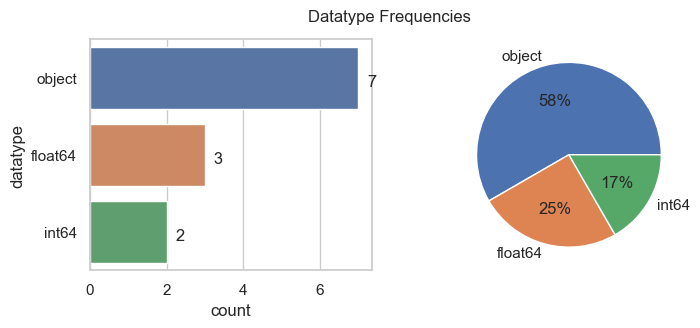

In [11]:
type_dict = {str(k): list(v) for k, v in Health_Data.groupby(Health_Data.dtypes, axis=1)}
for k, v in type_dict.items():
    print("{} -> {}".format(k,v))
    print("")
# end for
f, ax = plt.subplots(nrows=1, ncols=2,figsize=(8,3))
plt.suptitle('Datatype Frequencies',fontsize=12)
temp = Health_Data.dtypes.value_counts(ascending=False).reset_index() 
temp = temp.rename(columns={'index':'datatype', 0:'count'})
g = sns.barplot(data=temp, y='datatype', x='count', orient='h', ax=ax[0])
g = annotate_plot(g)
ax[1].pie(temp['count'], labels=temp['datatype'], autopct='%.0f%%')
plt.show()

<div class="alert alert-block alert-danger">
    <em><b>Insights/Remarks :</b></em>
    <br>
    <div class="alert alert-block alert-danger">
        <em><b>Data Insights :</b></em>
        <br>
        There are about 7 numerical variables (Which include both integer and float type) and about 5 categorical variables. 
    </div>
    <div class="alert alert-block alert-danger">
        <em><b>Health Insights :</b></em>
        <br>
        We can convert the Bmi, age and Avg_glucose_level in to catrgories.
    </div>    
</div>

### 2.2 Pandas Profiling / Dataprep package

#### 2.2.1 Pandas Profiling

<div class="alert alert-block alert-info">
    <b><em>Guidelines :</em></b>
    <br>
    The Pandas profiling module provides a comprehensive overview of the entire dataset. This report can also check basic distributions and correlations. Examine the inputs in the your_report.html file. 
</div>

In [12]:
profile = pp.ProfileReport(Health_Data, title="Pandas Profiling Report")

In [13]:
profile.to_file(report_path+"your_report.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [14]:
profile.to_notebook_iframe()

<div class="alert alert-block alert-danger">
    <em><b>Insights/Remarks :</b></em>
    <br>
    <div class="alert alert-block alert-danger">
        <em><b>Data Insights :</b></em>
        <br>
        The Pandas profiling package gives a complete overview of the dataset. 
         <br>
        1) There are no missing values in data set except in bmi column. It has total of 201 missing values which is 3.9%.
         <br>
        2) There are no Duplicate in entire Dataset.
    </div>
    <div class="alert alert-block alert-danger">
        <em><b>Health Insights :</b></em>
        <br>
        1) High glucose levels, BMI, hypertension, and heart disease are the leading causes of heart stroke. There are just 498 hypertension records and 276 heart disease records.
         <br>
        2) In the majority of the data, the BMI and Average Glucose levels are normal.
         <br>
         3) Using the given information, we may predict that there will be fewer recordings of heart attacks.    

#### 2.2.2 Dataprep package

<div class="alert alert-block alert-info">
    <b><em>Guidelines :</em></b>
    <br>
    The dataprep module provides a high-level overview of the entire dataset. This report can also check basic distributions and correlations. Because of its highly optimised DASK-based computing module, data preparation is faster than Pandas profiling.
</div>

In [15]:
# Report of the dataset using dataprep module
# Dataprep_report = create_report(Health_Data, title='HSP Report')
# Dataprep_report

<div class="alert alert-block alert-danger">
    <em><b>Insights/Remarks :</b></em>
    <br>
    <div class="alert alert-block alert-danger">
        <em><b>Data Insights :</b></em>
        <br>
       The Dataprep package also provides a complete overview of the dataset provided.
         <br>
        1) As the age is increasing Glucose Level is Increasing.
         <br>
        2) The people who are in between 25 - 60 are having high bmi.
        <br>
        3) The people having bmi in between 20 - 50 are proned to heart Stroke.
        <br>
        4) The people having bmi in between 20 - 50 are having high glucose levels.
        <br>
        5) Most of the People having hypertension when the bmi is in between  24 - 48. 
        <br>
        6) Most of the People having heart disease. when the bmi is in between  24 - 48. 
    </div>
    <div class="alert alert-block alert-danger">
        <em><b>Health Insights :</b></em>
        <br>
        1) The patients who are having age more than 50 are getting heart stroke.
        <br>
        2) The people who are in between 25 - 60 age are having high bmi.it is because of their diet and not having proper awareness on bmi. 
        <br>
        3) It is observed as bmi is the major factor for stroke. Every one should be aware of Bmi.
    </div>    
</div>

### 2.3 Describe

#### 2.3.1 Column descriptions

<div class="alert alert-block alert-info">
    <b><em>Guidelines :</em></b>
    <br>
    It gives the Basic Discriptive Statistics of the Data Set
</div>

In [16]:
# Column descriptions

print(Health_Data.describe())

                 id          age  avg_glucose_level          bmi       stroke
count   5110.000000  5110.000000        5110.000000  4909.000000  5110.000000
mean   36517.829354    43.226614         106.147677    28.893237     0.048728
std    21161.721625    22.612647          45.283560     7.854067     0.215320
min       67.000000     0.080000          55.120000    10.300000     0.000000
25%    17741.250000    25.000000          77.245000    23.500000     0.000000
50%    36932.000000    45.000000          91.885000    28.100000     0.000000
75%    54682.000000    61.000000         114.090000    33.100000     0.000000
max    72940.000000    82.000000         271.740000    97.600000     1.000000


<div class="alert alert-block alert-danger">
    <em><b>Insights/Remarks :</b></em>
    <br>
    <div class="alert alert-block alert-danger">
        <em><b>Data Insights :</b></em>
        <br>
        All the numerical columns have the same number of records Except BMI and it has 201 missing values. 
In this usecase, columns can be grouped under - Patient Personal information, Medical information.
    </div>
    <div class="alert alert-block alert-danger">
        <em><b>Health Insights :</b></em>
        <br>
        None
    </div>    
</div>

#### 2.3.2 Column distributions

<div class="alert alert-block alert-info">
    <b><em>Guidelines :</em></b>
    <br>
    Columns with just ID's don't contribute to the model performance. Hence, they can be removed.
</div>

In [17]:
# Find columns that are not having any distribution

cols_drop = []
for col in Health_Data.columns:
    if Health_Data[col].unique().shape[0] == Health_Data.shape[0]: # All values in a column are different, hence no distribution
        cols_drop.append(col)
    elif Health_Data[col].unique().shape[0] == 1:         # All values in a column are similar, hence no distribution
        cols_drop.append(col)
    # end if
# end for
print("Columns to drop: {}".format(cols_drop))

Columns to drop: ['id']


In [18]:
Health_Data = Health_Data.drop(cols_drop, axis=1)

<div class="alert alert-block alert-danger">
    <em><b>Insights/Remarks :</b></em>
    <br>
    <div class="alert alert-block alert-danger">
        <em><b>Data Insights :</b></em>
        <br>
        The 'id' column has unique Patient id's, hence can be dropped.
    </div>
    <div class="alert alert-block alert-danger">
        <em><b>Health Insights :</b></em>
        <br>
        None
    </div>    
</div>

#### 2.3.3 Separating features as numerical or categorical

<div class="alert alert-block alert-info">
    <b><em>Guidelines :</em></b>
    <br>
    Separating categorical and numerical features helps in handling the columns in an organized manner.
</div>

In [19]:
# Separate categorical and numerical features
#  check for date using is_datetime
print("Separate date, categorical and numerical columns\n")
cat_cols = []
num_cols = []

for col in Health_Data.columns:
    if Health_Data.dtypes[col] == 'object' or Health_Data.dtypes[col] == 'category':
        cat_cols.append(col)
    else:
        num_cols.append(col)
    # end if
# end for
print('Categorical columns : {}'.format(cat_cols))
print("")
print('Numerical columns   : {}'.format(num_cols))

Separate date, categorical and numerical columns

Categorical columns : ['gender', 'hypertension', 'heart_disease', 'ever_married', 'work_type', 'residence_type', 'smoking_status']

Numerical columns   : ['age', 'avg_glucose_level', 'bmi', 'stroke']


<div class="alert alert-block alert-danger">
    <em><b>Insights/Remarks :</b></em>
    <br>
    <div class="alert alert-block alert-danger">
        <em><b>Data Insights :</b></em>
        <br>
        The Numerical columns(6) are more than the Categorical columns(5).
    </div>
    <div class="alert alert-block alert-danger">
        <em><b>Health Insights :</b></em>
        <br>
        None
    </div>    
</div>

#### 2.3.4 Unique categories

<div class="alert alert-block alert-info">
    <b><em>Guidelines :</em></b>
    <br>
    Get to know the unique values in the categorical variable. It helps in clubbing categories if they mean the same, but are in different cases(uppercase/lowercase). Checking on the unique values helps in clubbing similar categories to create a new category. Brings insight if there are any Nan values as one of the categories.
</div>

gender : ['Male' 'Female' 'Other']

hypertension : ['0' '1']

heart_disease : ['1' '0']

ever_married : ['Yes' 'No']

work_type : ['Private' 'Self-employed' 'Govt_job' 'children' 'Never_worked']

residence_type : ['Urban' 'Rural']

smoking_status : ['formerly smoked' 'never smoked' 'smokes' 'Unknown']



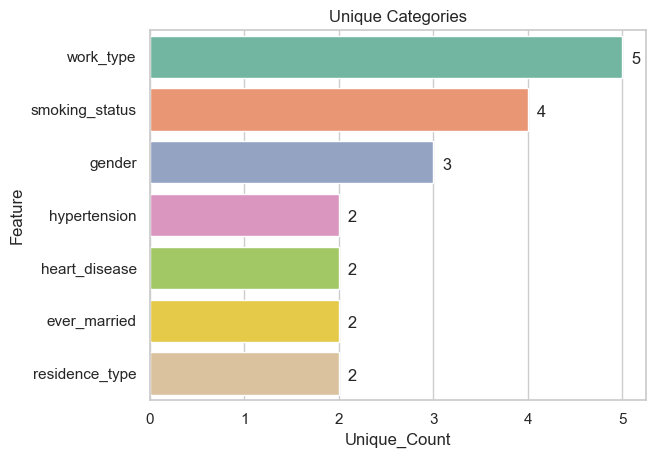

In [20]:
# Check for unique values in categorical columns

feat_list = []
count_list = []
for col in Health_Data[cat_cols]:
    print('{} : {}'.format(col,Health_Data[col].unique()))
    print("")
    feat_list.append(col)
    count_list.append(Health_Data[col].unique().shape[0])
# end for
Unique_cat_Health_Data = pd.DataFrame({'Feature':feat_list, 'Unique_Count':count_list})
Unique_cat_Health_Data = Unique_cat_Health_Data.sort_values(by='Unique_Count', ascending=False)
g = sns.barplot(data=Unique_cat_Health_Data, y='Feature', x='Unique_Count', orient='h', palette='Set2')
g = annotate_plot(g)
plt.title("Unique Categories")
plt.show()

<div class="alert alert-block alert-danger">
    <em><b>Insights/Remarks :</b></em>
    <br>
    <div class="alert alert-block alert-danger">
        <em><b>Data Insights :</b></em>
        <br>
        The Categories of different variables contain only nominal values so we can use onehot encoding for each category.
    </div>
    <div class="alert alert-block alert-danger">
        <em><b>Health Insights :</b></em>
        <br>
        None
    </div>    
</div>

#### 2.3.5 Unique Category count

<div class="alert alert-block alert-info">
    <b><em>Guidelines :</em></b>
    <br>
    Getting to know the class distribution in a feature helps to know whether it is uniform among the classes or not.
</div>

In [21]:
# Check for unique values in categorical columns

for col in Health_Data[cat_cols]:
    print('{} : {}'.format(col,Health_Data[col].value_counts()))
    print()
# end for

gender : Female    2994
Male      2115
Other        1
Name: gender, dtype: int64

hypertension : 0    4612
1     498
Name: hypertension, dtype: int64

heart_disease : 0    4834
1     276
Name: heart_disease, dtype: int64

ever_married : Yes    3353
No     1757
Name: ever_married, dtype: int64

work_type : Private          2925
Self-employed     819
children          687
Govt_job          657
Never_worked       22
Name: work_type, dtype: int64

residence_type : Urban    2596
Rural    2514
Name: residence_type, dtype: int64

smoking_status : never smoked       1892
Unknown            1544
formerly smoked     885
smokes              789
Name: smoking_status, dtype: int64



In [22]:
# Calculating the Distribution in Percentages for each category.
gender_percentage = Health_Data['gender'].value_counts(normalize=True) * 100
print("Gender:")
print(gender_percentage)

# Calculate the percentage of each category in the 'ever_married' column
ever_married_percentage = Health_Data['ever_married'].value_counts(normalize=True) * 100
print("\nEver Married:")
print(ever_married_percentage)

# Calculate the percentage of each category in the 'work_type' column
work_type_percentage = Health_Data['work_type'].value_counts(normalize=True) * 100
print("\nWork Type:")
print(work_type_percentage)

# Calculate the percentage of each category in the 'residence_type' column
residence_type_percentage = Health_Data['residence_type'].value_counts(normalize=True) * 100
print("\nResidence Type:")
print(residence_type_percentage)

# Calculate the percentage of each category in the 'smoking_status' column
smoking_status_percentage = Health_Data['smoking_status'].value_counts(normalize=True) * 100
print("\nSmoking Status:")
print(smoking_status_percentage)

Gender:
Female    58.590998
Male      41.389432
Other      0.019569
Name: gender, dtype: float64

Ever Married:
Yes    65.616438
No     34.383562
Name: ever_married, dtype: float64

Work Type:
Private          57.240705
Self-employed    16.027397
children         13.444227
Govt_job         12.857143
Never_worked      0.430528
Name: work_type, dtype: float64

Residence Type:
Urban    50.802348
Rural    49.197652
Name: residence_type, dtype: float64

Smoking Status:
never smoked       37.025440
Unknown            30.215264
formerly smoked    17.318982
smokes             15.440313
Name: smoking_status, dtype: float64


<div class="alert alert-block alert-danger">
    <em><b>Insights/Remarks :</b></em>
    <br>
    <div class="alert alert-block alert-danger">
        <em><b>Data Insights :</b></em>
        <br>
       1)Gender: The distribution is somewhat imbalanced, with the majority of individuals being female (58.59%) and male (41.39%). The "Other" category is extremely rare (0.02%).
        <br>
2)Ever Married: The distribution is moderately imbalanced, with a majority of individuals being married (65.62%) compared to those who have never been married (34.38%).
        <br>
3)Work Type: The distribution is imbalanced, with the "Private" category being the most prevalent (57.24%), followed by "Self-employed" (16.03%), "Children" (13.44%), "Govt_job" (12.86%), and "Never_worked" (0.43%).
        <br>
4)Residence Type: The distribution is relatively balanced, with a slight majority of individuals living in urban areas (50.80%) compared to rural areas (49.20%).
        <br>
5) Smoking Status: The distribution is imbalanced, with a higher proportion of individuals falling into the "never smoked" (37.03%) and "unknown" (30.22%) categories, while the "formerly smoked" (17.32%) and "smokes" (15.44%) categories have lower frequencies.
    <div class="alert alert-block alert-danger">
        <em><b>Health Insights :</b></em>
        <br>
        None
    </div>    
</div>

### 2.4 Duplicate checks

<div class="alert alert-block alert-info">
    <b><em>Guidelines :</em></b>
    <br>
    Checking for duplicate rows and handling them helps to build a better dataset.
</div>

In [23]:
# Check for duplicates

duplicate = Health_Data[Health_Data.duplicated()]
 
print("Duplicate Rows:\n {}".format(duplicate))

Duplicate Rows:
 Empty DataFrame
Columns: [gender, age, hypertension, heart_disease, ever_married, work_type, residence_type, avg_glucose_level, bmi, smoking_status, stroke]
Index: []


<div class="alert alert-block alert-danger">
    <em><b>Insights/Remarks :</b></em>
    <br>
    <div class="alert alert-block alert-danger">
        <em><b>Data Insights :</b></em>
        <br>
        There are no duplicate rows in entire datset.
    </div>
    <div class="alert alert-block alert-danger">
        <em><b>Health Insights :</b></em>
        <br>
        None
    </div>    
</div>

### 2.5 Missing values

<div class="alert alert-block alert-info">
    <b><em>Guidelines :</em></b>
    <br>
    Missing values can be addressed based on the percentage. If more than 50% of the values are missing in a column, it could be dropped or imputed by defining another model.
    <br>
</div>

In [24]:
# Missing values
print("Checking for null values\n")
for col in Health_Data.columns:
    tot_null = pd.isnull(Health_Data[col]).sum()
    pct_null = (float(tot_null) / Health_Data.shape[0]) * 100
    print('{:50s}: {:6d} {:8.2f}'.format(col, tot_null, pct_null))
# end for

Checking for null values

gender                                            :      0     0.00
age                                               :      0     0.00
hypertension                                      :      0     0.00
heart_disease                                     :      0     0.00
ever_married                                      :      0     0.00
work_type                                         :      0     0.00
residence_type                                    :      0     0.00
avg_glucose_level                                 :      0     0.00
bmi                                               :    201     3.93
smoking_status                                    :      0     0.00
stroke                                            :      0     0.00


<Axes: >

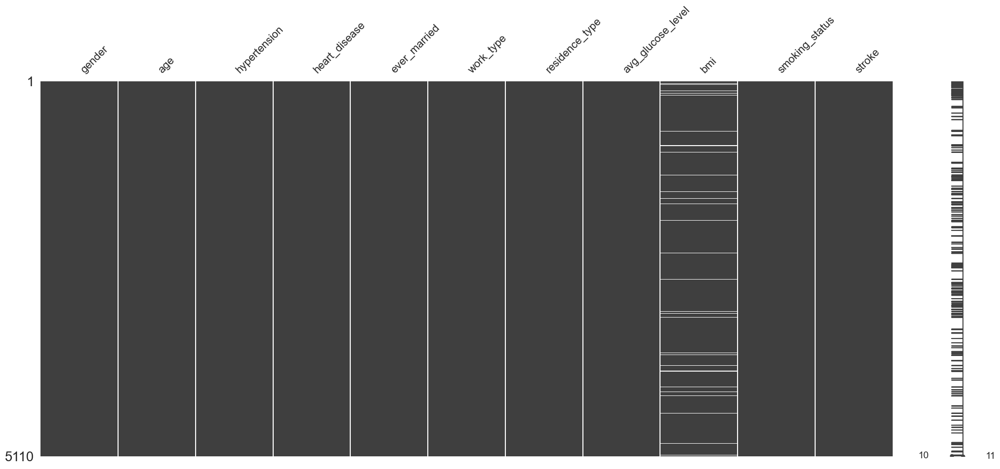

In [25]:
# https://towardsdatascience.com/using-the-missingno-python-library-to-identify-and-visualise-missing-data-prior-to-machine-learning-34c8c5b5f009#:~:text=Missingno%20is%20an%20excellent%20and,%2C%20heatmap%2C%20or%20a%20dendrogram.
msno.matrix(Health_Data)

<Axes: >

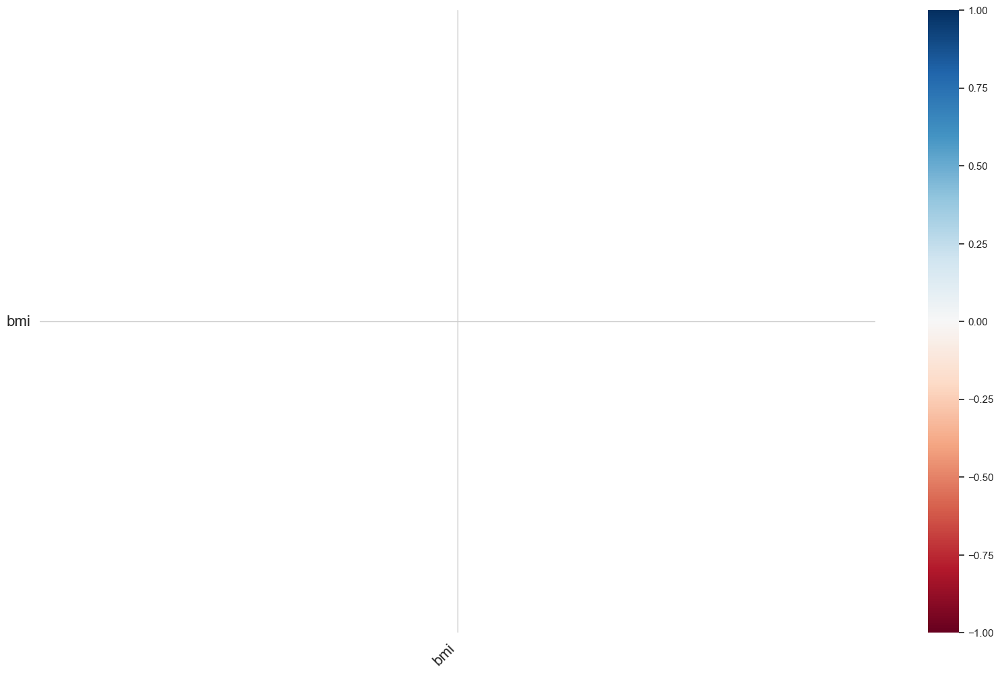

In [26]:
msno.heatmap(Health_Data)

<div class="alert alert-block alert-danger">
    <em><b>Insights/Remarks :</b></em>
    <br>
    <div class="alert alert-block alert-danger">
        <em><b>Data Insights :</b></em>
        <br>
           There are 201 missing values in bmi which is 3.93%and there are no missing values in other columns. Hence we can use KNN imputation to fill the missing values. 
    </div>
    <div class="alert alert-block alert-danger">
        <em><b>Health Insights :</b></em>
        <br>
        None
    </div>    
</div>

In [27]:
Health_Data.isnull().sum()

gender                 0
age                    0
hypertension           0
heart_disease          0
ever_married           0
work_type              0
residence_type         0
avg_glucose_level      0
bmi                  201
smoking_status         0
stroke                 0
dtype: int64

In [28]:
# KNN Imputation is used to impute the missing values in bmi column

# Select the columns with missing values
columns_with_missing = ['bmi']

# Create a copy of the original dataset
Health_Data_imputed = Health_Data.copy()

# Initialize the KNN imputer
imputer = KNNImputer(n_neighbors=5)

# Perform KNN imputation
Health_Data_imputed[columns_with_missing] = imputer.fit_transform(Health_Data[columns_with_missing])

# Check the imputed dataset
Health_Data_imputed.head()

,gender,age,hypertension,heart_disease,ever_married,work_type,residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,Male,67.0,0,1,Yes,Private,Urban,228.69,36.600000,formerly smoked,1
1,Female,61.0,0,0,Yes,Self-employed,Rural,202.21,28.893237,never smoked,1
2,Male,80.0,0,1,Yes,Private,Rural,105.92,32.500000,never smoked,1
3,Female,49.0,0,0,Yes,Private,Urban,171.23,34.400000,smokes,1
4,Female,79.0,1,0,Yes,Self-employed,Rural,174.12,24.000000,never smoked,1


<div class="alert alert-block alert-danger">
    <em><b>Insights/Remarks :</b></em>
    <br>
    <div class="alert alert-block alert-danger">
        <em><b>Data Insights :</b></em>
        <br>
           After KNN imputation the missing values are filled. Hence the data is clean to perform EDA.
    </div>
    <div class="alert alert-block alert-danger">
        <em><b>Health Insights :</b></em>
        <br>
        None
    </div>    
</div>

In [29]:
# Dropping the BMI column to concat the imputed bmi column
columns_to_drop = ['bmi']
Health_Data_New = Health_Data.drop(columns_to_drop, axis=1)

In [30]:
Health_Data_New

,gender,age,hypertension,heart_disease,ever_married,work_type,residence_type,avg_glucose_level,smoking_status,stroke
0,Male,67.0,0,1,Yes,Private,Urban,228.69,formerly smoked,1
1,Female,61.0,0,0,Yes,Self-employed,Rural,202.21,never smoked,1
2,Male,80.0,0,1,Yes,Private,Rural,105.92,never smoked,1
3,Female,49.0,0,0,Yes,Private,Urban,171.23,smokes,1
4,Female,79.0,1,0,Yes,Self-employed,Rural,174.12,never smoked,1
...,...,...,...,...,...,...,...,...,...,...
5105,Female,80.0,1,0,Yes,Private,Urban,83.75,never smoked,0
5106,Female,81.0,0,0,Yes,Self-employed,Urban,125.20,never smoked,0
5107,Female,35.0,0,0,Yes,Self-employed,Rural,82.99,never smoked,0
5108,Male,51.0,0,0,Yes,Private,Rural,166.29,formerly smoked,0


In [31]:
# Adding the bmi column to the datset to get the processed dataset
Health_Data_imputed = Health_Data_imputed[['bmi']]

In [32]:
Health_Data_imputed

,bmi
0,36.600000
1,28.893237
2,32.500000
3,34.400000
4,24.000000
...,...
5105,28.893237
5106,40.000000
5107,30.600000
5108,25.600000


In [33]:
Health_Data_Imputed_New=pd.concat([Health_Data_imputed,Health_Data_New],axis=1)

In [34]:
# Pre processed dataset
Health_Data_Imputed_New

,bmi,gender,age,hypertension,heart_disease,ever_married,work_type,residence_type,avg_glucose_level,smoking_status,stroke
0,36.600000,Male,67.0,0,1,Yes,Private,Urban,228.69,formerly smoked,1
1,28.893237,Female,61.0,0,0,Yes,Self-employed,Rural,202.21,never smoked,1
2,32.500000,Male,80.0,0,1,Yes,Private,Rural,105.92,never smoked,1
3,34.400000,Female,49.0,0,0,Yes,Private,Urban,171.23,smokes,1
4,24.000000,Female,79.0,1,0,Yes,Self-employed,Rural,174.12,never smoked,1
...,...,...,...,...,...,...,...,...,...,...,...
5105,28.893237,Female,80.0,1,0,Yes,Private,Urban,83.75,never smoked,0
5106,40.000000,Female,81.0,0,0,Yes,Self-employed,Urban,125.20,never smoked,0
5107,30.600000,Female,35.0,0,0,Yes,Self-employed,Rural,82.99,never smoked,0
5108,25.600000,Male,51.0,0,0,Yes,Private,Rural,166.29,formerly smoked,0


In [35]:
Health_Data_Imputed_New.isnull().sum()

bmi                  0
gender               0
age                  0
hypertension         0
heart_disease        0
ever_married         0
work_type            0
residence_type       0
avg_glucose_level    0
smoking_status       0
stroke               0
dtype: int64

## 3 Data Transformation for categorical Columns

In [36]:
# Categorize bmi_category column
bmi_categories = [0, 18.5, 24.9, 29.9, float('inf')]
bmi_labels = ['Underweight', 'Normal weight', 'Overweight', 'Obesity']
Health_Data_Imputed_New['bmi_category'] = pd.cut(Health_Data_Imputed_New['bmi'], bins=bmi_categories, labels=bmi_labels)

# Drop the 'bmi' column
Health_Data_Cat = Health_Data_Imputed_New.drop('bmi', axis=1)

In [37]:
Health_Data_Cat

,gender,age,hypertension,heart_disease,ever_married,work_type,residence_type,avg_glucose_level,smoking_status,stroke,bmi_category
0,Male,67.0,0,1,Yes,Private,Urban,228.69,formerly smoked,1,Obesity
1,Female,61.0,0,0,Yes,Self-employed,Rural,202.21,never smoked,1,Overweight
2,Male,80.0,0,1,Yes,Private,Rural,105.92,never smoked,1,Obesity
3,Female,49.0,0,0,Yes,Private,Urban,171.23,smokes,1,Obesity
4,Female,79.0,1,0,Yes,Self-employed,Rural,174.12,never smoked,1,Normal weight
...,...,...,...,...,...,...,...,...,...,...,...
5105,Female,80.0,1,0,Yes,Private,Urban,83.75,never smoked,0,Overweight
5106,Female,81.0,0,0,Yes,Self-employed,Urban,125.20,never smoked,0,Obesity
5107,Female,35.0,0,0,Yes,Self-employed,Rural,82.99,never smoked,0,Obesity
5108,Male,51.0,0,0,Yes,Private,Rural,166.29,formerly smoked,0,Overweight


In [38]:
# Categorize 'avg_glucose_level' column
glucose_categories = [0, 70, 100, 126, float('inf')]
glucose_labels = ['Low', 'Normal', 'Pre-Diabetic', 'Diabetic']
Health_Data_Cat['glucose_category'] = pd.cut(Health_Data_Cat['avg_glucose_level'], bins=glucose_categories, labels=glucose_labels)

# Drop the 'avg_glucose_level' column
Health_Data_Cat1 = Health_Data_Cat.drop('avg_glucose_level', axis=1)



In [39]:
Health_Data_Cat1

,gender,age,hypertension,heart_disease,ever_married,work_type,residence_type,smoking_status,stroke,bmi_category,glucose_category
0,Male,67.0,0,1,Yes,Private,Urban,formerly smoked,1,Obesity,Diabetic
1,Female,61.0,0,0,Yes,Self-employed,Rural,never smoked,1,Overweight,Diabetic
2,Male,80.0,0,1,Yes,Private,Rural,never smoked,1,Obesity,Pre-Diabetic
3,Female,49.0,0,0,Yes,Private,Urban,smokes,1,Obesity,Diabetic
4,Female,79.0,1,0,Yes,Self-employed,Rural,never smoked,1,Normal weight,Diabetic
...,...,...,...,...,...,...,...,...,...,...,...
5105,Female,80.0,1,0,Yes,Private,Urban,never smoked,0,Overweight,Normal
5106,Female,81.0,0,0,Yes,Self-employed,Urban,never smoked,0,Obesity,Pre-Diabetic
5107,Female,35.0,0,0,Yes,Self-employed,Rural,never smoked,0,Obesity,Normal
5108,Male,51.0,0,0,Yes,Private,Rural,formerly smoked,0,Overweight,Diabetic


In [40]:
 # Categorize 'age' column
age_categories = [0, 18, 35, 55, float('inf')]
age_labels = ['Child', 'Young', 'Middle Aged', 'Old Aged']
Health_Data_Cat1['age_group'] = pd.cut(Health_Data_Cat1['age'], bins=age_categories, labels=age_labels)

# Drop the 'age' column
Health_Data_Final = Health_Data_Cat1.drop('age', axis=1)

In [41]:
Health_Data_Final

,gender,hypertension,heart_disease,ever_married,work_type,residence_type,smoking_status,stroke,bmi_category,glucose_category,age_group
0,Male,0,1,Yes,Private,Urban,formerly smoked,1,Obesity,Diabetic,Old Aged
1,Female,0,0,Yes,Self-employed,Rural,never smoked,1,Overweight,Diabetic,Old Aged
2,Male,0,1,Yes,Private,Rural,never smoked,1,Obesity,Pre-Diabetic,Old Aged
3,Female,0,0,Yes,Private,Urban,smokes,1,Obesity,Diabetic,Middle Aged
4,Female,1,0,Yes,Self-employed,Rural,never smoked,1,Normal weight,Diabetic,Old Aged
...,...,...,...,...,...,...,...,...,...,...,...
5105,Female,1,0,Yes,Private,Urban,never smoked,0,Overweight,Normal,Old Aged
5106,Female,0,0,Yes,Self-employed,Urban,never smoked,0,Obesity,Pre-Diabetic,Old Aged
5107,Female,0,0,Yes,Self-employed,Rural,never smoked,0,Obesity,Normal,Young
5108,Male,0,0,Yes,Private,Rural,formerly smoked,0,Overweight,Diabetic,Middle Aged


In [42]:
Health_Data_Imputed_New

,bmi,gender,age,hypertension,heart_disease,ever_married,work_type,residence_type,avg_glucose_level,smoking_status,stroke,bmi_category
0,36.600000,Male,67.0,0,1,Yes,Private,Urban,228.69,formerly smoked,1,Obesity
1,28.893237,Female,61.0,0,0,Yes,Self-employed,Rural,202.21,never smoked,1,Overweight
2,32.500000,Male,80.0,0,1,Yes,Private,Rural,105.92,never smoked,1,Obesity
3,34.400000,Female,49.0,0,0,Yes,Private,Urban,171.23,smokes,1,Obesity
4,24.000000,Female,79.0,1,0,Yes,Self-employed,Rural,174.12,never smoked,1,Normal weight
...,...,...,...,...,...,...,...,...,...,...,...,...
5105,28.893237,Female,80.0,1,0,Yes,Private,Urban,83.75,never smoked,0,Overweight
5106,40.000000,Female,81.0,0,0,Yes,Self-employed,Urban,125.20,never smoked,0,Obesity
5107,30.600000,Female,35.0,0,0,Yes,Self-employed,Rural,82.99,never smoked,0,Obesity
5108,25.600000,Male,51.0,0,0,Yes,Private,Rural,166.29,formerly smoked,0,Overweight


In [43]:
Health_Data_Imputed_New.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5110 entries, 0 to 5109
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype   
---  ------             --------------  -----   
 0   bmi                5110 non-null   float64 
 1   gender             5110 non-null   object  
 2   age                5110 non-null   float64 
 3   hypertension       5110 non-null   object  
 4   heart_disease      5110 non-null   object  
 5   ever_married       5110 non-null   object  
 6   work_type          5110 non-null   object  
 7   residence_type     5110 non-null   object  
 8   avg_glucose_level  5110 non-null   float64 
 9   smoking_status     5110 non-null   object  
 10  stroke             5110 non-null   int64   
 11  bmi_category       5110 non-null   category
dtypes: category(1), float64(3), int64(1), object(7)
memory usage: 444.5+ KB


In [44]:
# # Before Converting the dtype
Health_Data_Final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5110 entries, 0 to 5109
Data columns (total 11 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   gender            5110 non-null   object  
 1   hypertension      5110 non-null   object  
 2   heart_disease     5110 non-null   object  
 3   ever_married      5110 non-null   object  
 4   work_type         5110 non-null   object  
 5   residence_type    5110 non-null   object  
 6   smoking_status    5110 non-null   object  
 7   stroke            5110 non-null   int64   
 8   bmi_category      5110 non-null   category
 9   glucose_category  5110 non-null   category
 10  age_group         5110 non-null   category
dtypes: category(3), int64(1), object(7)
memory usage: 335.1+ KB


In [45]:
 # List of columns to convert to 'object' data type
columns_to_convert = ['bmi_category', 'glucose_category', 'age_group']

 # Convert the data types of the columns to 'object'
Health_Data_Final[columns_to_convert] = Health_Data_Final[columns_to_convert].astype('object')

In [46]:
# # After converting the data types
Health_Data_Final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5110 entries, 0 to 5109
Data columns (total 11 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   gender            5110 non-null   object
 1   hypertension      5110 non-null   object
 2   heart_disease     5110 non-null   object
 3   ever_married      5110 non-null   object
 4   work_type         5110 non-null   object
 5   residence_type    5110 non-null   object
 6   smoking_status    5110 non-null   object
 7   stroke            5110 non-null   int64 
 8   bmi_category      5110 non-null   object
 9   glucose_category  5110 non-null   object
 10  age_group         5110 non-null   object
dtypes: int64(1), object(10)
memory usage: 439.3+ KB


<div class="alert alert-block alert-danger">
    <em><b>Insights/Remarks :</b></em>
    <br>
    <div class="alert alert-block alert-danger">
        <em><b>Data Insights :</b></em>
        <br>
            In this data Age, Average Glucose Levels and BMI columns are categorized in to different categories according to levels. After this transformation we can draw some good conclusions from the data.
    </div>
    <div class="alert alert-block alert-danger">
        <em><b>Health Insights :</b></em>
        <br>
        None
    </div>    
</div>

<div class="alert alert-block alert-info">
    <b><em>Guidelines :</em></b>
    <br>
       Health_Data_Final is used for category based EDA where as Health_Data_Imputed_New dataset is used for numerical based Analysis.
</div>

## 4. Data Distribution  (single variable) - Raw Data

<div class="alert alert-block alert-warning">
    <div class="alert alert-block alert-warning">
        <b><em>Why:</em></b>
        <br>
        Data points are generated based on some underlying distributions inherent to the data generation process. Intent is to get an understanding of those distributions so that it can guide us in feature transformation / feature engineering tasks
    </div>
    <div class="alert alert-block alert-warning">
        <b><em>Insights:</em></b>
        <br>
       


### 4.1 Numerical variables

#### 4.1.1 Outliers in Numeric variables

<div class="alert alert-block alert-info">
    <b><em>Guidelines :</em></b>
    <br>
    Get to know if there are any Outliers in the numerical columns. And could check how tightly the data is grouped, check if the data is symmetric.
</div>

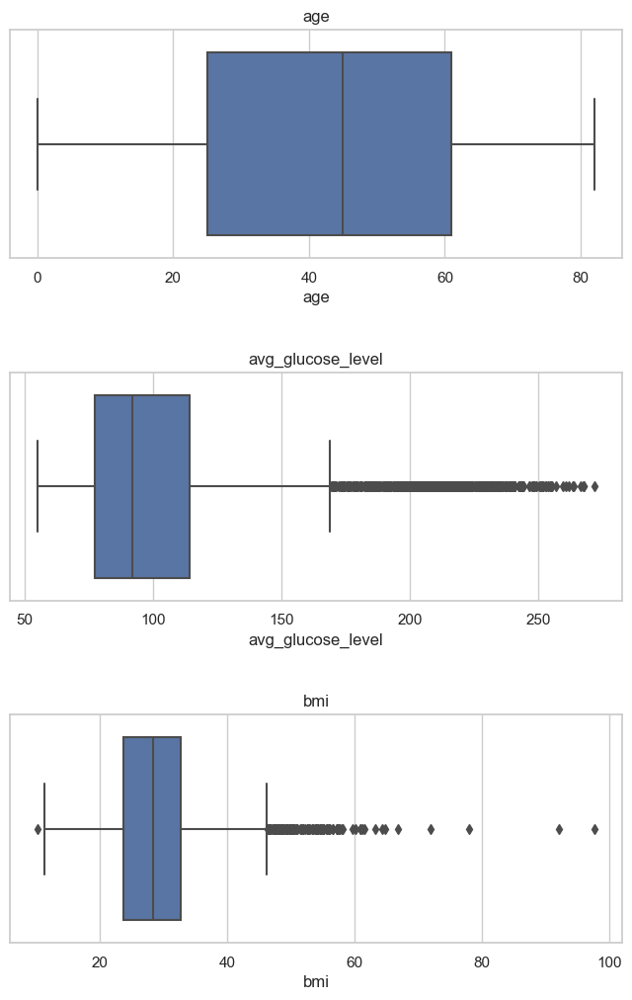

In [47]:
excluded_cols = ["hypertension", "heart_disease", "stroke"]
included_cols = [col for col in num_cols if col not in excluded_cols]

fig, axes = plt.subplots(len(included_cols), figsize=(8, 4*len(included_cols)))
fig.subplots_adjust(hspace=0.5)  # Adjust vertical spacing between subplots

for i, col in enumerate(included_cols):
    ax = axes[i]
    sns.boxplot(data=Health_Data_Imputed_New, x=col, ax=ax, palette="deep")
    ax.set_title(col)  # Set subplot title as column name

plt.show()

In [48]:
# Count of Outliers
numeric_columns = Health_Data_Imputed_New.select_dtypes(include=np.number).columns

outliers_count = {}

for column in numeric_columns:
    column_values = Health_Data_Imputed_New[column]
    Q1 = column_values.quantile(0.25)
    Q3 = column_values.quantile(0.75)
    IQR = Q3 - Q1
    
    outliers_count[column] = ((column_values < (Q1 - 1.5 * IQR)) | (column_values > (Q3 + 1.5 * IQR))).sum()

tmp = pd.DataFrame({'Feature': list(outliers_count.keys()), 'Outliers': list(outliers_count.values())})


In [49]:
Health_Data_Imputed_New

,bmi,gender,age,hypertension,heart_disease,ever_married,work_type,residence_type,avg_glucose_level,smoking_status,stroke,bmi_category
0,36.600000,Male,67.0,0,1,Yes,Private,Urban,228.69,formerly smoked,1,Obesity
1,28.893237,Female,61.0,0,0,Yes,Self-employed,Rural,202.21,never smoked,1,Overweight
2,32.500000,Male,80.0,0,1,Yes,Private,Rural,105.92,never smoked,1,Obesity
3,34.400000,Female,49.0,0,0,Yes,Private,Urban,171.23,smokes,1,Obesity
4,24.000000,Female,79.0,1,0,Yes,Self-employed,Rural,174.12,never smoked,1,Normal weight
...,...,...,...,...,...,...,...,...,...,...,...,...
5105,28.893237,Female,80.0,1,0,Yes,Private,Urban,83.75,never smoked,0,Overweight
5106,40.000000,Female,81.0,0,0,Yes,Self-employed,Urban,125.20,never smoked,0,Obesity
5107,30.600000,Female,35.0,0,0,Yes,Self-employed,Rural,82.99,never smoked,0,Obesity
5108,25.600000,Male,51.0,0,0,Yes,Private,Rural,166.29,formerly smoked,0,Overweight


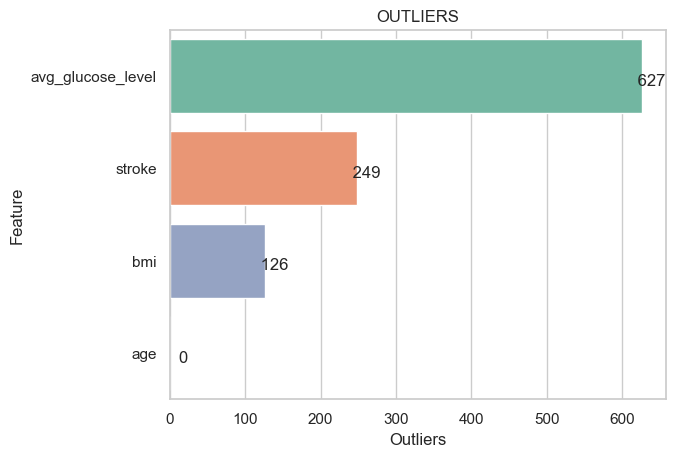

{'bmi': 126, 'age': 0, 'avg_glucose_level': 627, 'stroke': 249}

In [50]:
tmp = tmp.sort_values(by='Outliers', ascending=False)
g = sns.barplot(data=tmp, y='Feature', x='Outliers', orient='h', palette='Set2')
g = annotate_plot(g)
plt.title("OUTLIERS")
plt.show()
outliers_count

<div class="alert alert-block alert-danger">
    <em><b>Insights/Remarks :</b></em>
    <br>
    <div class="alert alert-block alert-danger">
        <em><b>Data Insights :</b></em>
        <br>
        Hence after analysisng the data we have outliers in average glucose level and bmi columns. The distribution of target variable in outlier data is twice the distribution of actual dataset..
    </div>
    <div class="alert alert-block alert-danger">
        <em><b>Health Insights :</b></em>
        <br>
        None
    </div>    
</div>

#### 4.1.2 Distributions of Numeric variables

<div class="alert alert-block alert-info">
    <b><em>Guidelines :</em></b>
    <br>
    Learn about the various numerical variable distributions. A histogram is a graphical representation of data in which data is organised into continuous number ranges, with each range represented by a vertical bar. We can look at the plots and determine which type of distribution the numerical variable belongs to, for example, uniform/normal/exponential distributions, and so on.
</div>

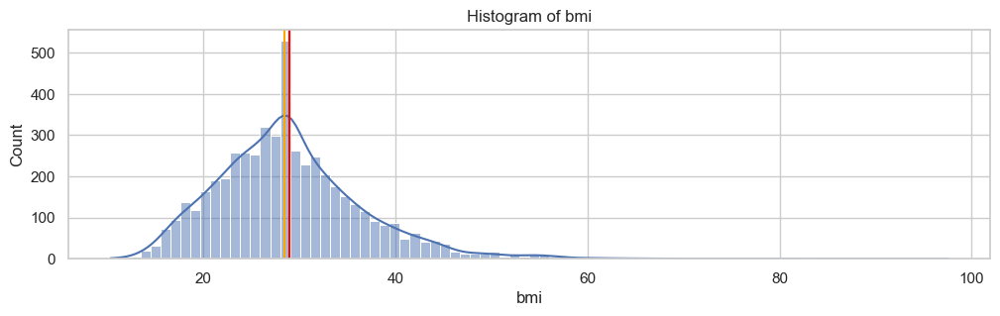

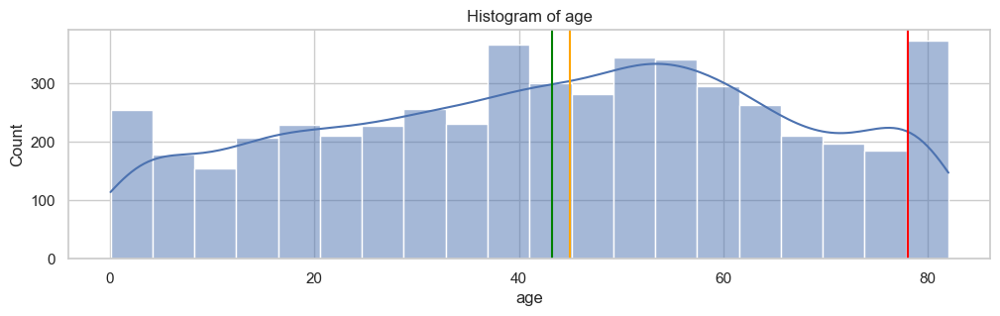

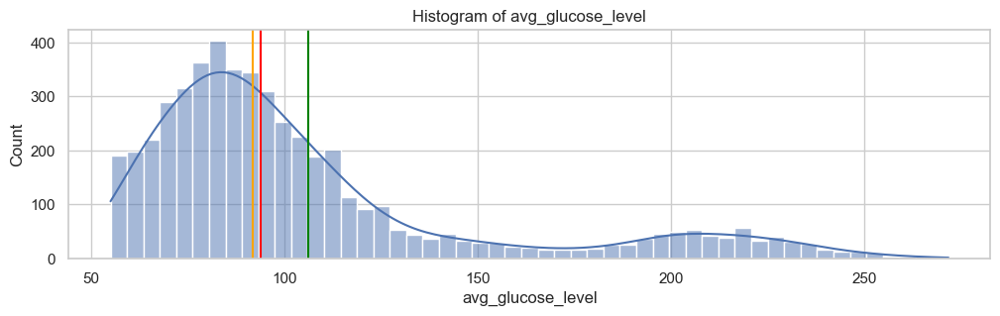

In [51]:
variables = ['bmi', 'age', 'avg_glucose_level']

for var in variables:
    plt.figure(figsize=(12, 3))
    sns.histplot(Health_Data_Imputed_New[var], kde=True)
    plt.axvline(Health_Data_Imputed_New[var].mean(), color='green')
    plt.axvline(Health_Data_Imputed_New[var].median(), color='orange')
    plt.axvline(Health_Data_Imputed_New[var].mode().item(), color='red')
    plt.title(f'Histogram of {var}')
    plt.show()


<div class="alert alert-block alert-danger">
    <em><b>Insights/Remarks :</b></em>
    <br>
    <div class="alert alert-block alert-danger">
        <em><b>Data Insights :</b></em>
        <br>
            The bmi column is nearly normal distribution and we can see mode, mean and median are same. Age is left Skewed and Average Glucose level is Right Skewed
    </div>
    <div class="alert alert-block alert-danger">
        <em><b>Health Insights :</b></em>
        <br>
        1) The majority of the values in the BMI Column ranges from 20 to 40.
        <br>
        2) The average glucose level is usually between 50 and 100, indicating that the majority of people have either low or normal levels.

    

### 4.2 Categorical variables

#### 4.2.1 Check distribution of Categorical variables

In [52]:
# # Separate categorical and numerical features final dataset for EDA
print("Separate date, categorical and numerical columns\n")
cat_cols1 = []
num_cols1 = []

for col in Health_Data_Final.columns:
    if Health_Data_Final.dtypes[col] == 'object' or Health_Data_Final.dtypes[col] == 'category':
        cat_cols1.append(col)
    else:
        num_cols1.append(col)
    # end if
# end for
print('Categorical columns : {}'.format(cat_cols1))
print("")
print('Numerical columns   : {}'.format(num_cols1))

Separate date, categorical and numerical columns

Categorical columns : ['gender', 'hypertension', 'heart_disease', 'ever_married', 'work_type', 'residence_type', 'smoking_status', 'bmi_category', 'glucose_category', 'age_group']

Numerical columns   : ['stroke']


<div class="alert alert-block alert-danger">
    <em><b>Insights/Remarks :</b></em>
    <br>
    <div class="alert alert-block alert-danger">
        <em><b>Data Insights :</b></em>
        <br>
            In this transformed dataset  the categorical columns are more than numerical variables.
    </div>
    <div class="alert alert-block alert-danger">
        <em><b>Health Insights :</b></em>
        <br>
        None
    </div>    
</div>

gender : ['Male' 'Female' 'Other']

hypertension : ['0' '1']

heart_disease : ['1' '0']

ever_married : ['Yes' 'No']

work_type : ['Private' 'Self-employed' 'Govt_job' 'children' 'Never_worked']

residence_type : ['Urban' 'Rural']

smoking_status : ['formerly smoked' 'never smoked' 'smokes' 'Unknown']

bmi_category : ['Obesity' 'Overweight' 'Normal weight' 'Underweight']

glucose_category : ['Diabetic' 'Pre-Diabetic' 'Normal' 'Low']

age_group : ['Old Aged' 'Middle Aged' 'Child' 'Young']



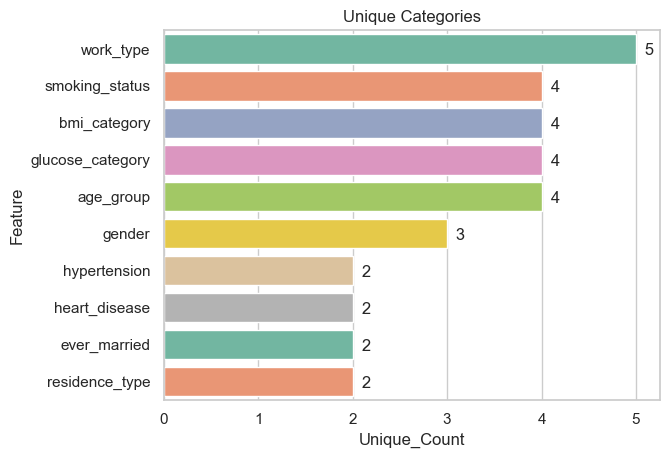

In [53]:
# # Check for unique values in categorical columns transformed dataset

feat_list1 = []
count_list1 = []
for col in Health_Data_Final[cat_cols1]:
    print('{} : {}'.format(col,Health_Data_Final[col].unique()))
    print("")
    feat_list1.append(col)
    count_list1.append(Health_Data_Final[col].unique().shape[0])
# end for
Unique_cat_Health_Data = pd.DataFrame({'Feature': feat_list1, 'Unique_Count': count_list1})
Unique_cat_Health_Data = Unique_cat_Health_Data.sort_values(by='Unique_Count', ascending=False)
g = sns.barplot(data=Unique_cat_Health_Data, y='Feature', x='Unique_Count', orient='h', palette='Set2')
g = annotate_plot(g)
plt.title("Unique Categories")
plt.show()

<div class="alert alert-block alert-danger">
    <em><b>Insights/Remarks :</b></em>
    <br>
    <div class="alert alert-block alert-danger">
        <em><b>Data Insights :</b></em>
        <br>
            In this we have transformed the columns Bmi, Age and Average Glucose levels in to categories for the purpose of EDA for training the model we use actual dataset where we can see the above coumns as float.
    </div>
    <div class="alert alert-block alert-danger">
        <em><b>Health Insights :</b></em>
        <br>
        None
    </div>    
</div>

<div class="alert alert-block alert-info">
    <b><em>Guidelines :</em></b>
    <br>
    Learn about the distribution of categories across all Categorical variables. It is vital to understand the frequency of each category in each categorical variable. If the categories are spread too thin, this visualisation might help determine whether they can be condensed into a larger group. Alternatively, break the categories into several categories to achieve a more even dispersion. 
</div>

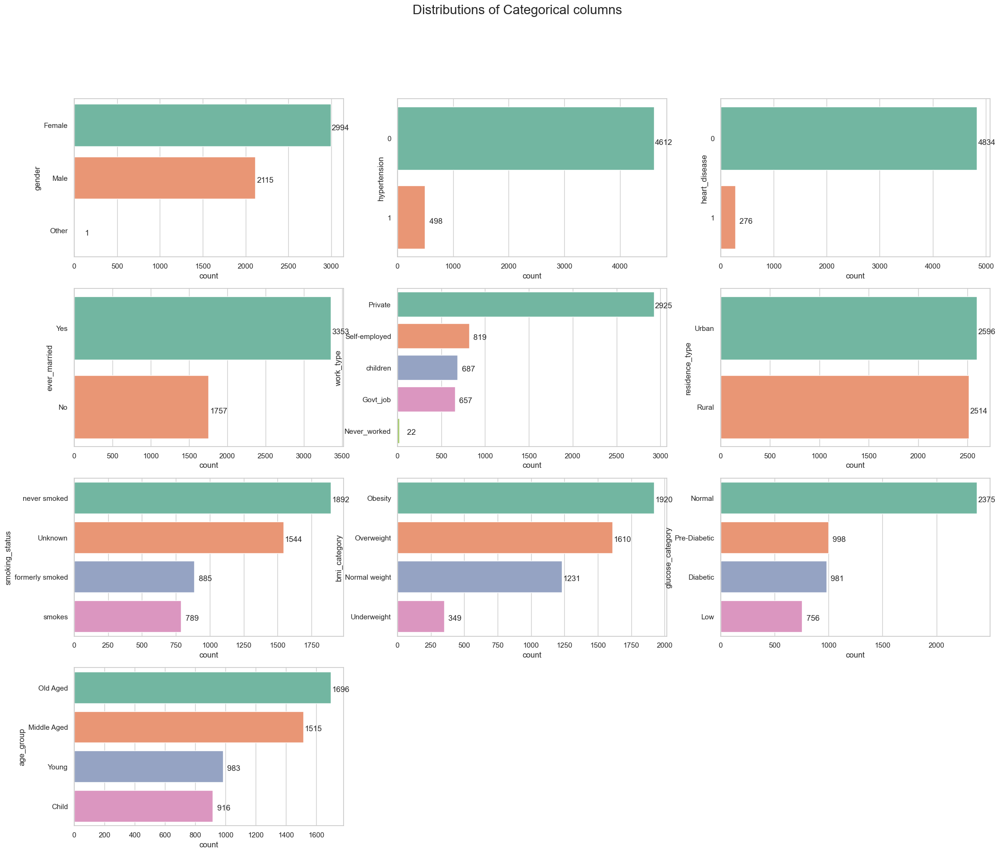

In [54]:
# # Check distribution of Categorical variables

# Utility functions for plotting
def set_custom_palette(series, max_color = 'turquoise', other_color = 'grey'):
    max_val = series.max()
    pal = []
    
    for item in series:
        if item == max_val:
            pal.append(max_color)
        else:
            pal.append(other_color)
    return pal



def annotate_plot(splot):
    for p in splot.patches:
        splot.annotate('{:4d}'.format(int(p.get_width())),
                    (p.get_width(), p.get_y() + p.get_height()-0.35), 
                    ha = 'center', va = 'center', 
                    xytext = (15, 0), 
                    textcoords = 'offset points')
    # end for
    return splot

tmp_df = Health_Data_Final[cat_cols1]
n = len(cat_cols1)
if n/2 == 0: # even number
    cols = 4
    rows = int(n/cols)
elif n/3 == 0:   # odd number
    cols = 3
    rows = int(n/cols)
else: # not divisible
    cols = 3
    rows = int(n/cols) + 1
# end if

# Create a Position index
pos = range(1,n + 1)

# Create main figure

fig = plt.figure(1, figsize=(25,20))
for k, col in zip(range(n), tmp_df):
    # add every single subplot to the figure with a for loop
    ax = fig.add_subplot(rows,cols,pos[k])
    g = sns.countplot(data=tmp_df, y=tmp_df[col], ax=ax, palette="Set2", orient='h', order=Health_Data_Final[col].value_counts().index)
    g = annotate_plot(g)
# end for
plt.suptitle("Distributions of Categorical columns", fontsize=20)
plt.show()

<div class="alert alert-block alert-danger">
    <em><b>Insights/Remarks :</b></em>
    <br>
    <div class="alert alert-block alert-danger">
        <em><b>Data Insights :</b></em>
        <br>
       Except for gender and employment type, which have relatively small proportions, the categories in each variable are uneven.
    </div>
    <div class="alert alert-block alert-danger">
        <em><b>Health Insights :</b></em>
        <br>
        None
    </div>    
</div>

## 5 Comparison - Relationships between independent (predictor) variables (both numerical & categorical) considering all data

<div class="alert alert-block alert-warning">
    <div class="alert alert-block alert-warning">
        <b><em>Why:</em></b>
        <br>
        To get a deeper understanding of data, uncover useful Health Insights, detect multicollinearity (for interpretable models), perform feature selection and model selection
    </div>
    <div class="alert alert-block alert-warning">
        <em><b>Insights :</b></em>
        <br>
        Identify relationships between variables, multicollinearity, patterns and trends in the data.
    For e.g., if two variables are highly correlated, only 1 can be used as model input
    </div>
</div>

### 5.1 Among numerical variables

#### 5.1.1 Crosstab

<div class="alert alert-block alert-info">
    <b><em>Guidelines :</em></b>
    <br>
    Captures the relationship between the numerical features in the dataset. Intuitions of the distributions and dependencies between variables can be drawn.
</div>

In [55]:
fig = px.scatter(Health_Data_Imputed_New, x=Health_Data_Imputed_New["age"], y=Health_Data_Imputed_New["bmi"], 
                 title='Corelation Between Age and Bmi', color = Health_Data["age"],trendline="ols")
fig.update_layout(title_text='Corelation Between Age and Bmi', title_x=0.5)
fig.show()

In [56]:
fig = px.scatter(Health_Data_Imputed_New, x=Health_Data_Imputed_New["age"], y=Health_Data_Imputed_New["avg_glucose_level"], 
                 title='Corelation Between Age and avg_glucose_level', color = Health_Data["age"],trendline="ols")
fig.update_layout(title_text='Corelation Between Age and avg_glucose_level', title_x=0.5)
fig.show()

In [57]:
fig = px.scatter(Health_Data_Imputed_New, x="avg_glucose_level", y="bmi", 
                 title='Correlation Between bmi and avg_glucose_level', color="avg_glucose_level", trendline="ols")
fig.update_layout(title_text='Correlation Between bmi and avg_glucose_level', title_x=0.5)
fig.show()

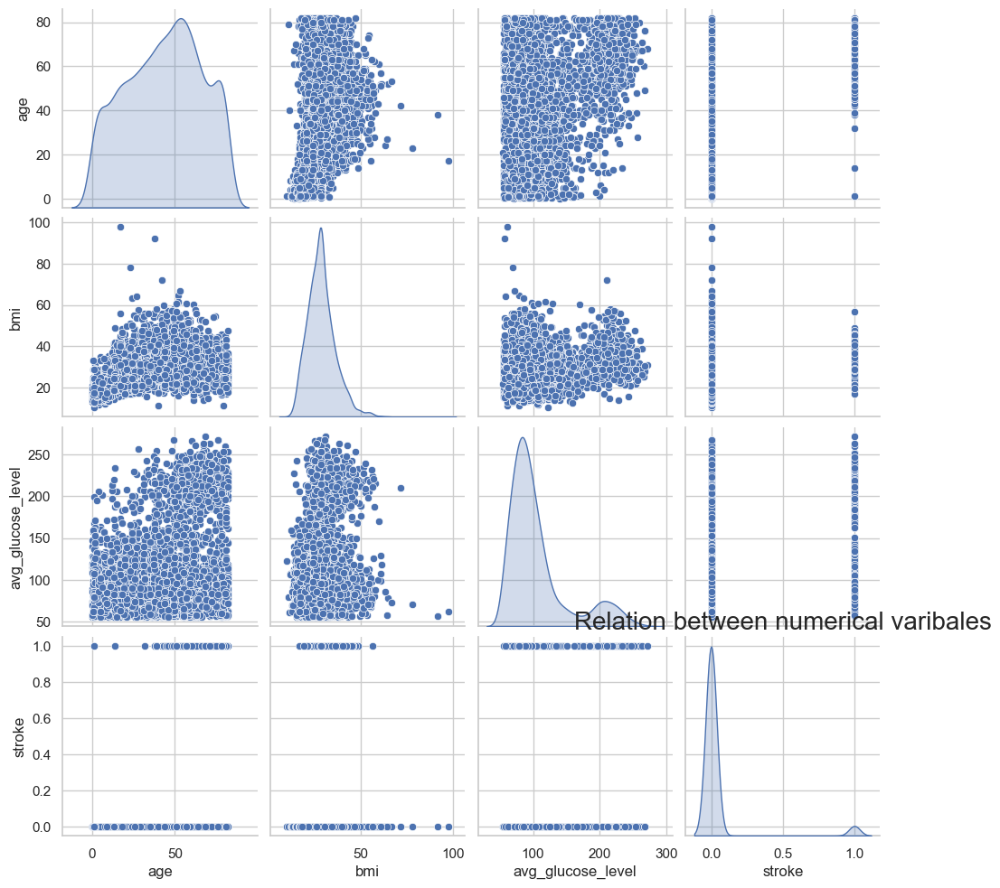

In [58]:
num_cols2 = ['age', 'bmi', 'avg_glucose_level','hypertension','heart_disease','stroke']
sns.pairplot(Health_Data_Imputed_New[num_cols2], diag_kind='kde')
plt.title("Relation between numerical varibales", fontsize=20)
plt.show()

<Axes: >

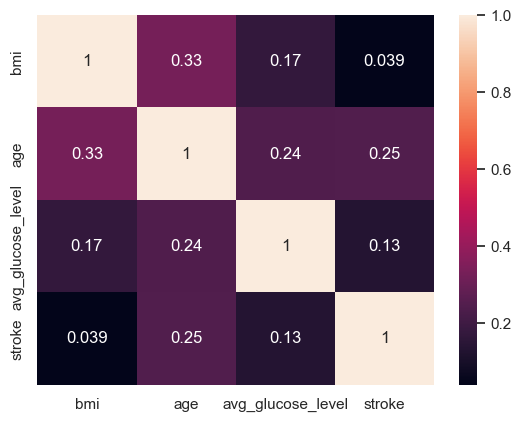

In [59]:
sns.heatmap(Health_Data_Imputed_New.corr(),annot=True)

<div class="alert alert-block alert-danger">
    <em><b>Insights/Remarks :</b></em>
    <br>
    <div class="alert alert-block alert-danger">
        <em><b>Data Insights :</b></em>
        <br>
     
1) The correlation coefficient of 0.17 between BMI and average glucose levels indicates a weak positive correlation.
        <br>
2) The correlation coefficient of 0.33 between BMI and age suggests a moderate positive correlation.
        <br>
3) The correlation coefficient of 0.24 between age and average glucose levels suggests a weak positive correlation.
    </div>
    <div class="alert alert-block alert-danger">
        <em><b>Health Insights :</b></em>
        <br>
        1) Since the correlation coefficient is relatively low,it implies that BMI alone is not a strong predictor of average glucose levels as well as Stroke.
        <br>
        2)The correlation between age and average glucose levels has potential health implications due to age-related changes in glucose regulation and insulin sensitivity.
        <br>
    </div>    
</div>

## 5.2 CORRELATION AMONG CATEGORICAL VARIABLES

#### 5.2.1 Correlation

<div class="alert alert-block alert-info">
    <b><em>Guidelines :</em></b>
    <br>
    The correlation between the features and target gives us an insight if the feature is contributing in predicting the target. Correlation between two independent variables gives us insight if either of them could be dropped, as it leads to multicollinearity. Columns with p-value below 0.05 (threshold can vary based on the use-case) can be considered as correlated. 
    <br>
    Chi-square test finds the probability of a Null hypothesis(H0).
    <br>
    <b>Assumption(H0)</b> : The two columns are not related with each other.
    <br>
    <b>Alternate(Ha)</b> : The two columms are related with each other.
    <br>
    <b>Result of Chi-Sq Test</b> : If p-value > 0.05 implies fail to reject H0. Else, p-value < 0.05 implies reject H0.
</div>

In [60]:
# Calculating the contigency table between the categorical columns and run Chi-square test
# https://thinkingneuron.com/how-to-measure-the-correlation-between-two-categorical-variables-in-python/

n = len(cat_cols1)
mat = []
for i, cat_col1 in enumerate(cat_cols1):  
    row = []
    for j, col in enumerate(cat_cols1):
        CrosstabResult = pd.crosstab(index=Health_Data_Final[col], columns=Health_Data_Final[cat_col1])
        ChiSqResult = chi2_contingency(CrosstabResult)
        row.append(ChiSqResult[1])
    mat.append(row)
cat_mat1 = pd.DataFrame(mat, columns=cat_cols1)

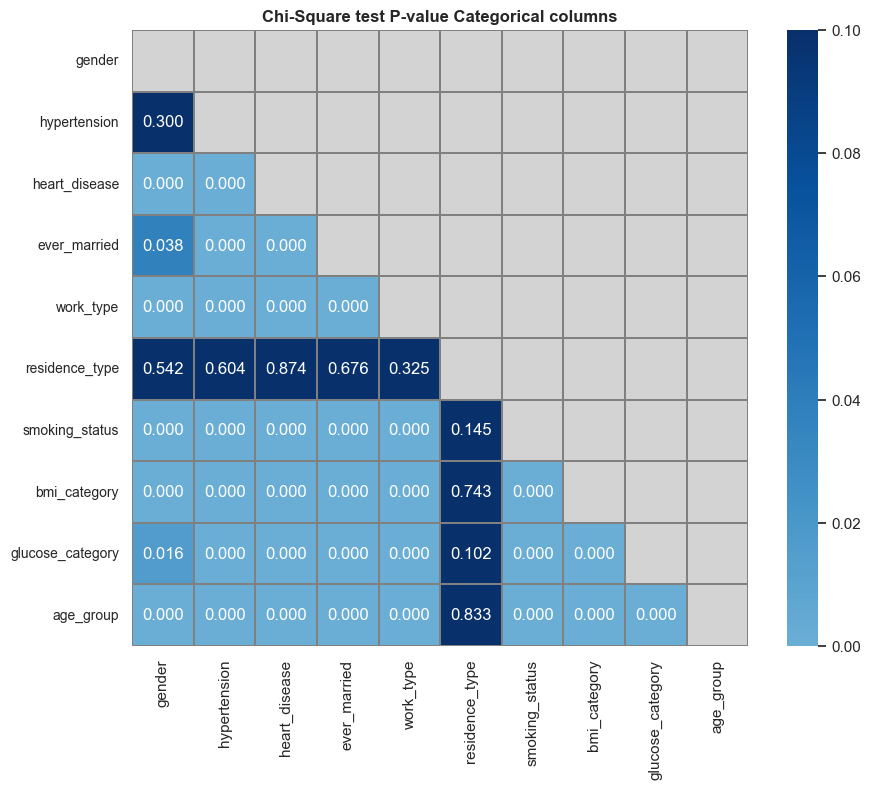

In [61]:
# Correlation between categorical columns

corrs = cat_mat1
mask = np.zeros_like(corrs)
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    f, ax = plt.subplots(figsize=(10, 8))
    ax.set_title('Chi-Square test P-value Categorical columns', fontsize=12, fontweight="bold")
    ax.set_facecolor('lightgrey')
    ax = sns.heatmap(corrs, mask=mask, vmax=.1, square=True, annot=True, linewidth=0.1, 
                     center=0, cmap="Blues", linecolor='grey', fmt='.3f')
    ax.set_yticklabels(cat_cols1, rotation=0, fontsize=10)
plt.show()

<div class="alert alert-block alert-danger">
    <em><b>Insights/Remarks :</b></em>
    <br>
    <div class="alert alert-block alert-danger">
        <em><b>Data Insights :</b></em>
        <br>
        <br>
        The following variables look to be correlated based on the p-values provided by the Chi-square 
        test.
        <br>
        1. Gender with Glucose Category,Ever Married, Bmi Catgory,Age Group, Smoking Status.
        <br>
        2. Ever Married with Gender,Glucose Category,Bmi Catgory,Age Group, Smoking Status.
        <br>
        3. Work Type with Gender,Glucose Category,Bmi Catgory,Age Group, Smoking Status.
    </div>
    <div class="alert alert-block alert-danger">
        <em><b>Health Insights :</b></em>
        <br>
        None
    </div>    
</div>

### 5.3 Among both Numerical and Categorical variables

#### 5.3.1 Correlation

<div class="alert alert-block alert-info">
    <b><em>Guidelines :</em></b>
    <br>
    The correlation between the features and target gives us an insight if the feature is contributing in predicting the target. Correlation between two independent variables gives us insight if either of them could be dropped, as it leads to multicollinearity. Columns with correlation value above 0.05 (threshold can vary based on the use-case) can be considered as correlated. 
    <br>
    ANOVA hypothesis test
    <br>
        <b>Null hypothesis(H0)</b>: The variables are not correlated with each other
        <br>
        <b>P-value</b>: The probability of Null hypothesis being true
        <br>
        Accept Null hypothesis if P-value>0.05. Means variables are NOT correlated
        <br>
        Reject Null hypothesis if P-value<0.05. Means variables are correlated
</div>

In [62]:

print("Separate date, categorical and numerical columns\n")
cat_cols_New = []
num_cols_New = []

for col in Health_Data_Imputed_New.columns:
    if Health_Data_Imputed_New.dtypes[col] == 'object' or Health_Data_Imputed_New.dtypes[col] == 'category':
        cat_cols_New.append(col)
    else:
        num_cols_New.append(col)
    # end if
# end for
print('Categorical columns : {}'.format(cat_cols_New))
print("")
print('Numerical columns   : {}'.format(num_cols_New))

Separate date, categorical and numerical columns

Categorical columns : ['gender', 'hypertension', 'heart_disease', 'ever_married', 'work_type', 'residence_type', 'smoking_status', 'bmi_category']

Numerical columns   : ['bmi', 'age', 'avg_glucose_level', 'stroke']


In [63]:
Health_Data_Imputed_New.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5110 entries, 0 to 5109
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype   
---  ------             --------------  -----   
 0   bmi                5110 non-null   float64 
 1   gender             5110 non-null   object  
 2   age                5110 non-null   float64 
 3   hypertension       5110 non-null   object  
 4   heart_disease      5110 non-null   object  
 5   ever_married       5110 non-null   object  
 6   work_type          5110 non-null   object  
 7   residence_type     5110 non-null   object  
 8   avg_glucose_level  5110 non-null   float64 
 9   smoking_status     5110 non-null   object  
 10  stroke             5110 non-null   int64   
 11  bmi_category       5110 non-null   category
dtypes: category(1), float64(3), int64(1), object(7)
memory usage: 444.5+ KB


In [64]:
cat_cols_New = ['gender', 'ever_married', 'work_type', 'residence_type', 'smoking_status']
num_cols_New = ['bmi', 'age', 'hypertension', 'heart_disease', 'avg_glucose_level', 'stroke']

mat = []
for cat_col in cat_cols_New:
    row = []
    for num_col in num_cols_New:
        groups = []
        for group_name, group_data in Health_Data_Imputed_New.groupby(cat_col):
            groups.append(group_data[num_col].values)
        AnovaResult = f_oneway(*groups)
        row.append(AnovaResult.pvalue)
    mat.append(row)

cat_num_mat = pd.DataFrame(mat, columns=num_cols_New, index=cat_cols_New)

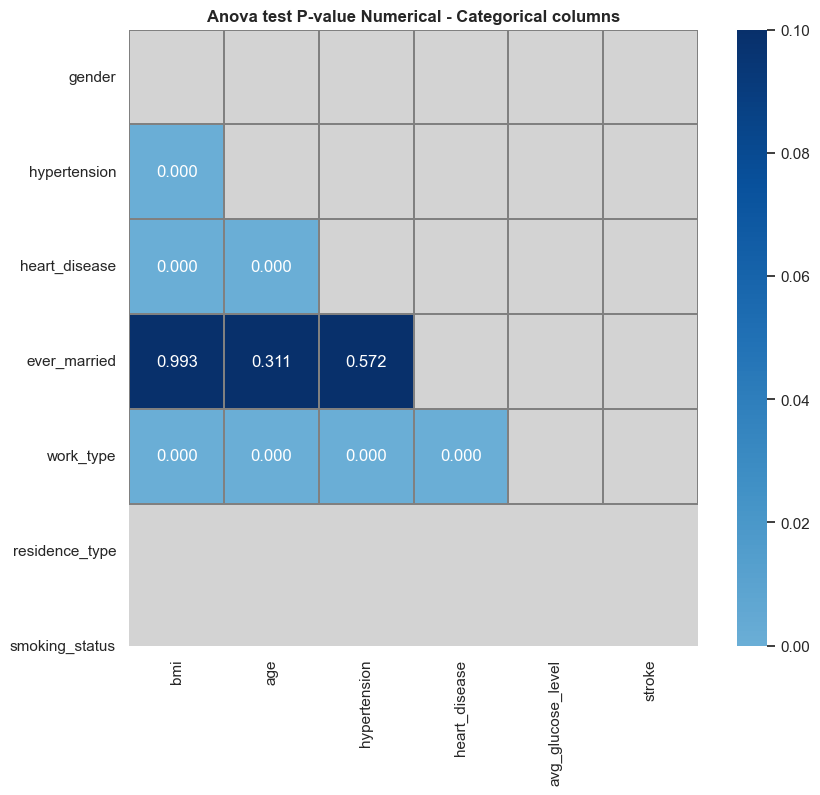

In [65]:
# Correlation between categorical columns

corrs = cat_num_mat
mask = np.zeros_like(corrs)
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    f, ax = plt.subplots(figsize=(10, 8))
    ax.set_title('Anova test P-value Numerical - Categorical columns', fontsize=12, fontweight="bold")
    ax.set_facecolor('lightgrey')
    ax = sns.heatmap(corrs, mask=mask, vmax=.1, square=True, annot=True, linewidth=0.1, 
                     center=0, cmap="Blues", linecolor='grey', yticklabels=cat_cols, fmt='.3f')
# end with
plt.show()

<div class="alert alert-block alert-danger">
    <em><b>Insights/Remarks :</b></em>
    <br>
    <div class="alert alert-block alert-danger">
        <em><b>Data Insights :</b></em>
        <br>
        <br>
        The following variables look to be correlated based on the p-values provided by the Chi-square 
        test.
        <br>
        1. Ever Married with BMI.
        <br>
        2. Work type with BMI.
        <br>
        3. Smoking Status with BMI.
        <br>
        4.Age with Work type and Smoking Status.
        <br>
        5.Hypetension and Heart Disease with Smoking Status.
    </div>
    <div class="alert alert-block alert-danger">
        <em><b>Health Insights :</b></em>
        <br>
        None
    </div>    
</div>

## 5.4 Among Categorical variables

### 5.4.1 Contingency Table

<div class="alert alert-block alert-info">
    <b><em>Guidelines :</em></b>
    <br>
    The stacked and normalized bar charts helps in noticing how the sub groups are varying wrt each other. Notice if there are any drastic influences of one category on another visually.
</div>

Directory '..//reports//figures//comparison//' already exists.
Unexpected exception formatting exception. Falling back to standard exception


Traceback (most recent call last):
  File "c:\users\ram\desktop\exfspectrumlite\heartstroke_prediction\.venv\lib\site-packages\IPython\core\interactiveshell.py", line 3508, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "C:\Users\ram\AppData\Local\Temp\ipykernel_12216\3402306476.py", line 33, in <module>
    ax = fig.add_subplot(rows, cols, pos[k])
  File "c:\users\ram\desktop\exfspectrumlite\heartstroke_prediction\.venv\lib\site-packages\matplotlib\figure.py", line 757, in add_subplot
    ax = projection_class(self, *args, **pkw)
  File "c:\users\ram\desktop\exfspectrumlite\heartstroke_prediction\.venv\lib\site-packages\matplotlib\axes\_base.py", line 644, in __init__
    subplotspec = SubplotSpec._from_subplot_args(fig, args)
  File "c:\users\ram\desktop\exfspectrumlite\heartstroke_prediction\.venv\lib\site-packages\matplotlib\gridspec.py", line 598, in _from_subplot_args
    raise ValueError(
ValueError: num must be an integer with 1 <= num <= 8, not 9

Dur

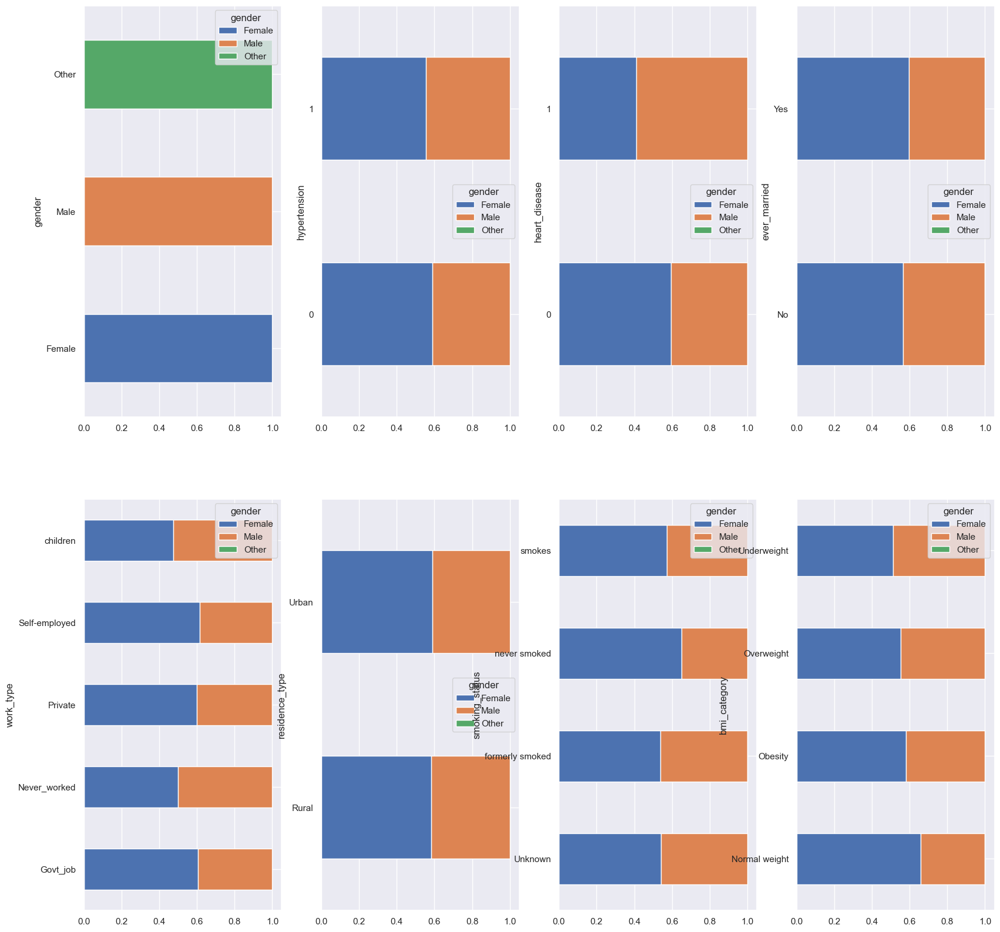

In [66]:

sns.set_theme(rc={'figure.max_open_warning': 0})
tmp_df = Health_Data_Final.copy()
cat_df = tmp_df[cat_cols1]
num_df = tmp_df[num_cols1]
n = len(cat_cols1)

if n % 2 == 0:  # even number
    cols = 4
    rows = int(n / cols)
elif n % 3 == 0:  # odd number
    cols = 3
    rows = int(n / cols)
else:  # not divisible
    cols = 3
    rows = int(n / cols) + 1

# Create a Position index
pos = range(1, n + 1)

path = report_path + 'comparison//'

try:
    os.makedirs(path)
except FileExistsError:
    print(f"Directory '{path}' already exists.")

# Create main figure
fig = plt.figure(1, figsize=(20, 20))
for cat_col in cat_df[1:]:
    plt.clf()
    for k, col in zip(range(n), cat_df):
        # add every single subplot to the figure with a for loop
        ax = fig.add_subplot(rows, cols, pos[k])
        # Crosstab is a contingency table if we are comparing two categorical variables.
        pd.crosstab(tmp_df[col], tmp_df[cat_col], normalize='index').plot(kind="barh", stacked=True, ax=ax)
    # end for
    display(fig)  # Shows plot again
    filename = path + 'bar' + '_' + cat_col
    plt.savefig(filename)
# end for


<div class="alert alert-block alert-danger">
    <em><b>Insights/Remarks :</b></em>
    <br>
    <div class="alert alert-block alert-danger">
        <em><b>Data Insights :</b></em>
        <br>
        1)Female patients have higher counts in practically every variable category, such as BMI, Glucose levels, and age group. 
        <br>
  2) People who smoke are more likely to be overweight. Obesity is more common among people who used to smoke.
        <br>
3) Diabetic patients are more likely to be obese.
        <br>
4) People in their forties and fifties are more likely to be obese.
        <br>
5) People in their forties and fifties are more likely to smoke than those in age groups.
        <br>
6) Diabetes affects the majority of the elderly.
        <br>
7) Obese people are more likely to be middle-aged or elderly.
    </div>    
</div>

## 6 Comparison - Relationships between independent (predictor) variables (both numerical & categorical) within subsections of data

<div class="alert alert-block alert-warning">
    <div class="alert alert-block alert-warning">
        <em><b>Why :</b></em>
        <br>
        To uncover relationships that are specific to certain sub-groups of the data that may not be apparent when analyzing the entire dataset, ensure accuracy of data-based conclusions and feed into feature engineering/selection and model selection. 
    </div>
    <div class="alert alert-block alert-warning">
        <em><b>Insights :</b></em>
        <br>
        Example:
        <br>
        Generate insights such as uncovering sub-group specific relationships, identifying outliers within sub-groups and detecting interaction between variables.
    </div>
</div>

#### 6.1 Average of numerical variables grouped by categories

<div class="alert alert-block alert-info">
    <b><em>Guidelines :</em></b>
    <br>
    Comparison of sub-category distributions can be done using a bar plot. Grouping/Aggregating the data in the sub categories helps to get a broader picture of the spread of data.
</div>

In [67]:
# Categorical with Numerical - Aggregate count to find average values of numerical variable grouped by category variable
def agg_avg(Health_Data_Imputed_New, group_field, calc_field):
    grouped = Health_Data_Imputed_New.groupby(group_field, as_index=False)[calc_field].mean()
    #grouped = grouped.sort(calc_field, ascending = False)
    grouped.columns = [group_field, 'Avg_' + str(calc_field)]
    return grouped

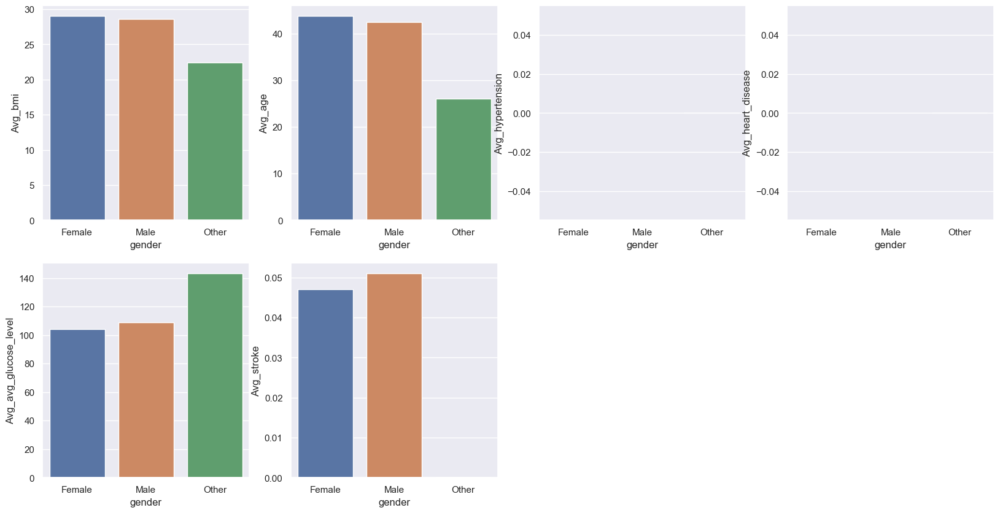

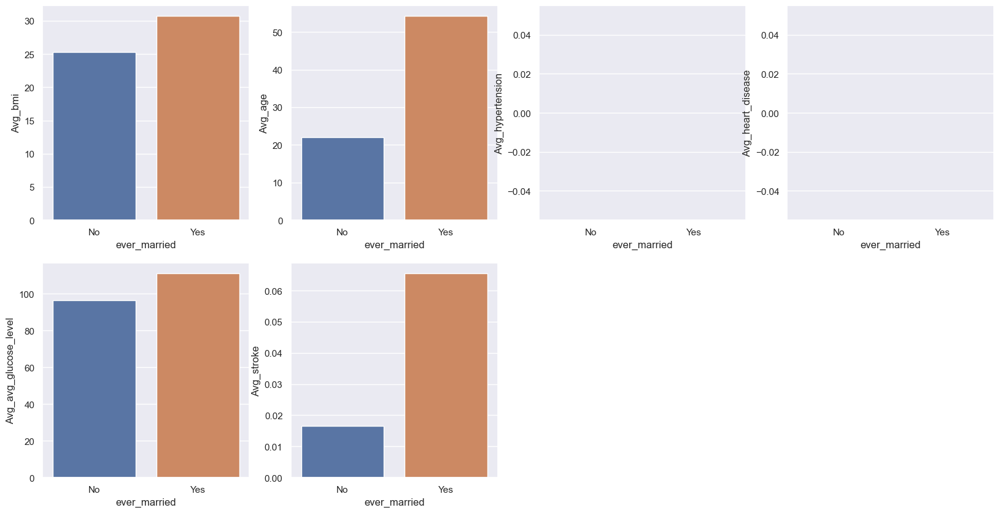

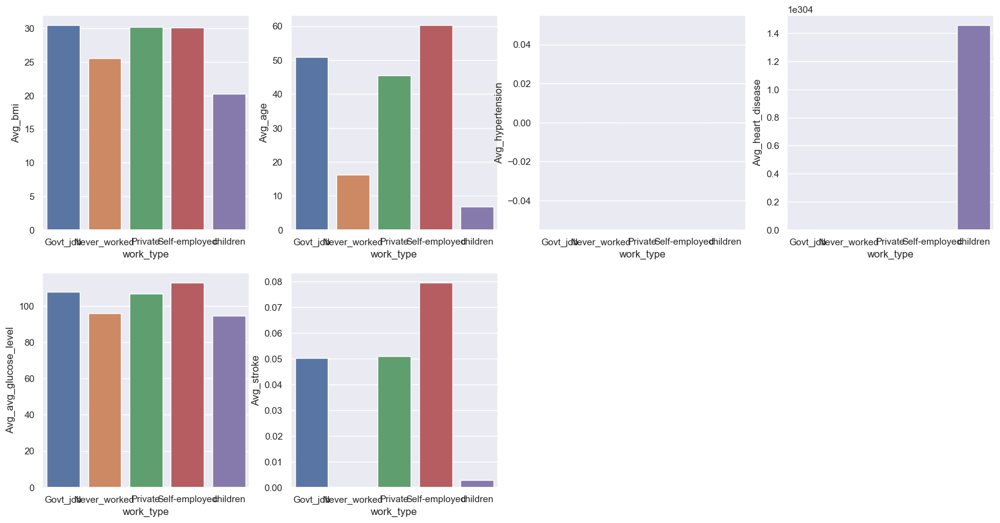

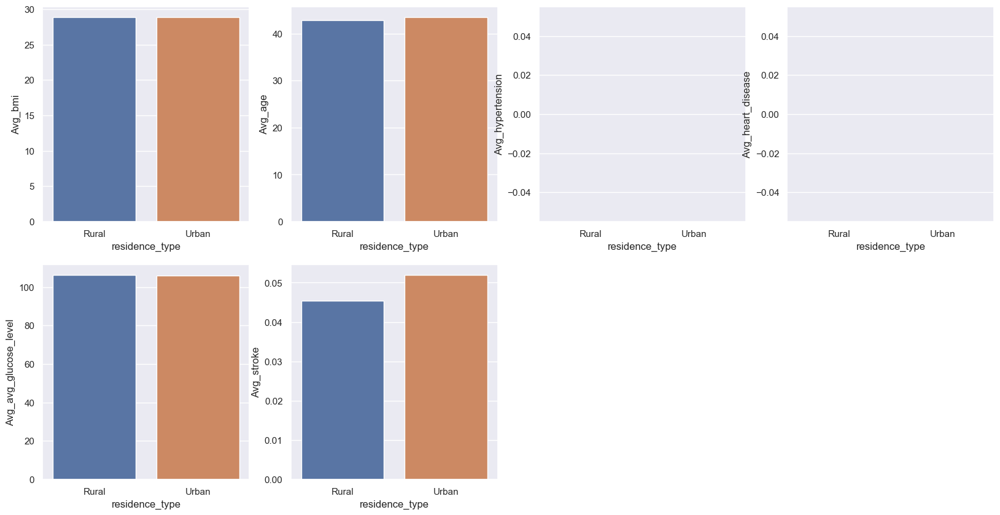

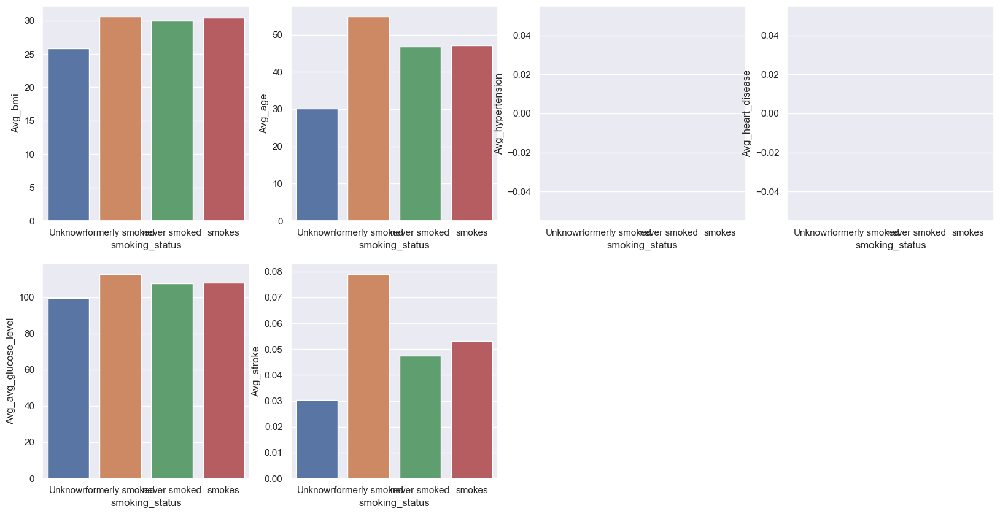

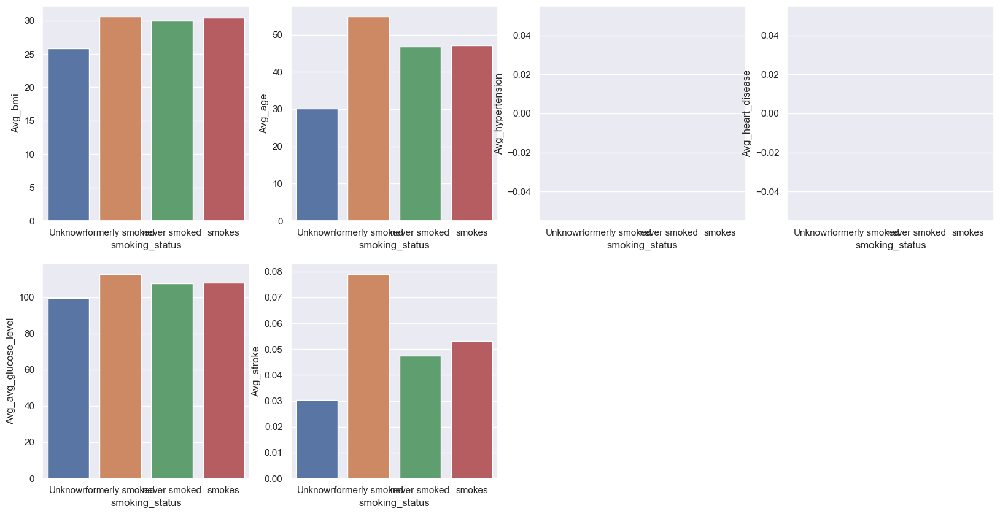

In [68]:
# Plot numerical and categorical columns together
sns.set_theme(rc={'figure.max_open_warning': 0})
tmp_df = Health_Data_Imputed_New.copy()
cat_df = tmp_df[cat_cols_New]
num_df = tmp_df[num_cols_New]
n = len(num_cols_New)

cols = min(n, 4)
rows = (n + cols - 1) // cols

# Create a Position index
pos = range(1, n + 1)

path = report_path + 'average//'
if not os.path.exists(path):
    os.mkdir(path)

# Create main figure
fig = plt.figure(1, figsize=(20, 10))

for i, cat_col in enumerate(cat_df):
    plt.clf()
    for k, col in zip(range(n), num_df):
        # add every single subplot to the figure with a for loop
        group_var = cat_col
        calc_var = col
        calc_var_avg = agg_avg(Health_Data_Imputed_New, group_var, calc_var)
        ax = fig.add_subplot(rows, cols, pos[k])
        yvar = 'Avg_' + calc_var
        ax = sns.barplot(data=calc_var_avg, x=group_var, y=yvar)
        ax.set(xlabel=group_var)

    # end for
    display(fig)
    filename = path + 'group' + '_' + cat_col
    plt.savefig(filename)

# end for


<div class="alert alert-block alert-danger">
    <em><b>Insights/Remarks :</b></em>
    <br>
    <div class="alert alert-block alert-danger">
        <em><b>Data Insights :</b></em>
        <br>
        None
    </div>
    <div class="alert alert-block alert-danger">
        <em><b>Health Insights:</b></em>
        <br>
        1) Males have a higher prevalence of hypertension and heart disease.
        <br>
2) Male and female heart stroke victims are nearly equal in number.
        <br>
3) A former smoker is more likely to get heart disease.
        <br>
4) Former smokers are more likely to suffer a heart attack.
        <br>
        5) People who got married have a higher risk of hypertension and heart disease.
    </div>    
</div>

#### 7 Comparison - Relationship between independent (predictor) variables and target variable considering all data

<div class="alert alert-block alert-warning">
    <div class="alert alert-block alert-warning">
        <em><b>Why :</b></em>
        <br>
        To get a deeper understanding of data, feed into feature selection, and model selection and development
    </div>
    <div class="alert alert-block alert-warning">
        <em><b>Insights :</b></em>
        <br>
        * Identify variables that are most relevant to the outcome and should be included in the model
        <br>
        * Identify which type of model (assumptions are satisfied by the underlying data) is best suited to the data and selection of hyperparameters    
    </div>
</div>

#### 7.1  Relationship between both categorical and numerical variables

<div class="alert alert-block alert-info">
    <b><em>Guidelines :</em></b>
    <br>
    The plot has 3 variables, 2 categorical and 1 numerical. It captures the relationship between the three variables. Looking at the plot we can get the insight whether the data points are scattered across the categories OR they are in clusters.
</div>

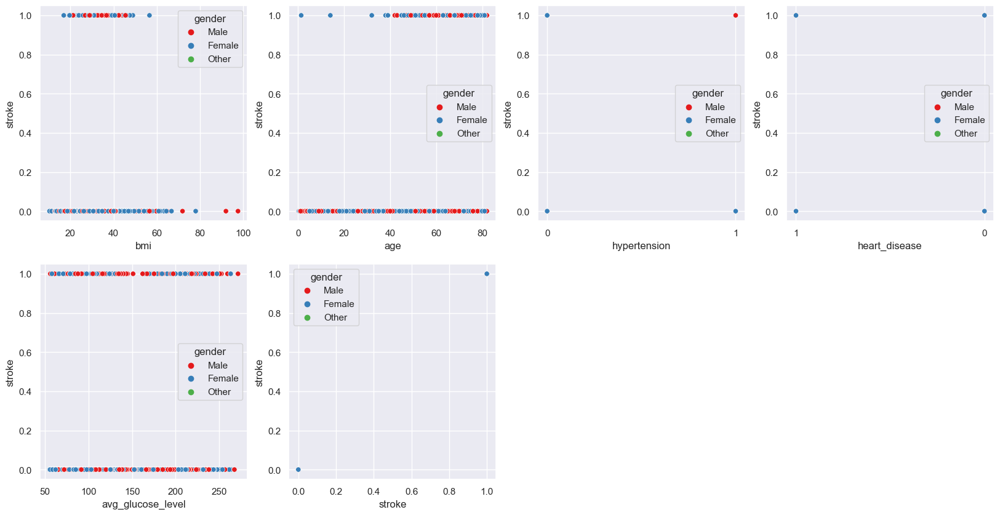

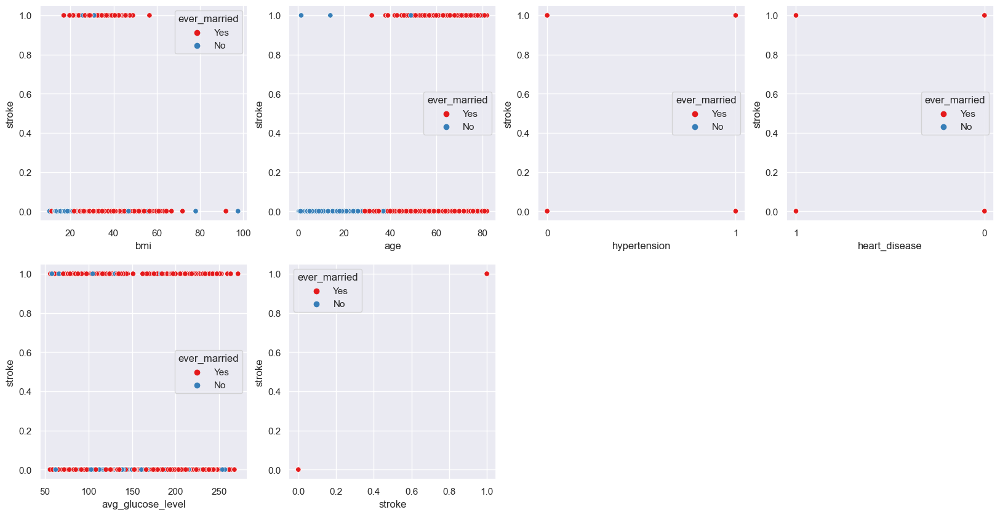

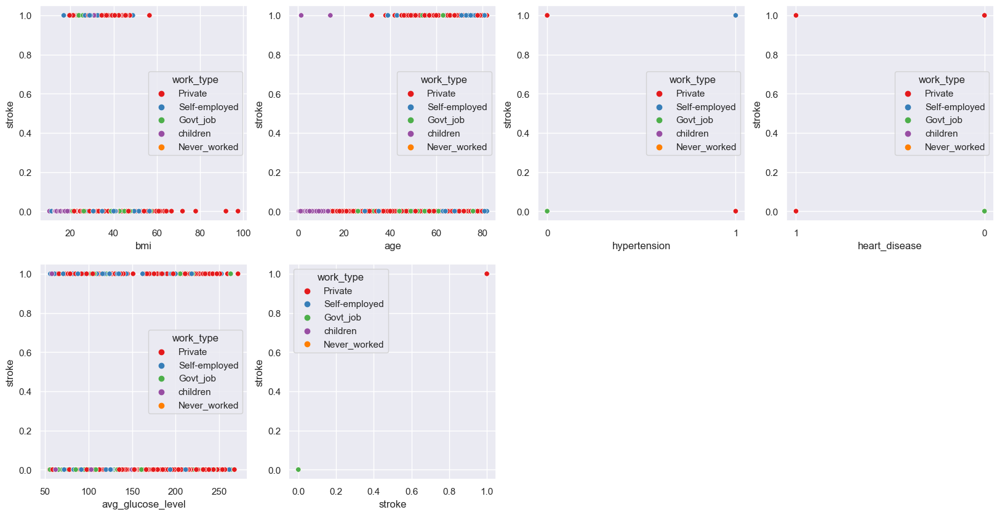

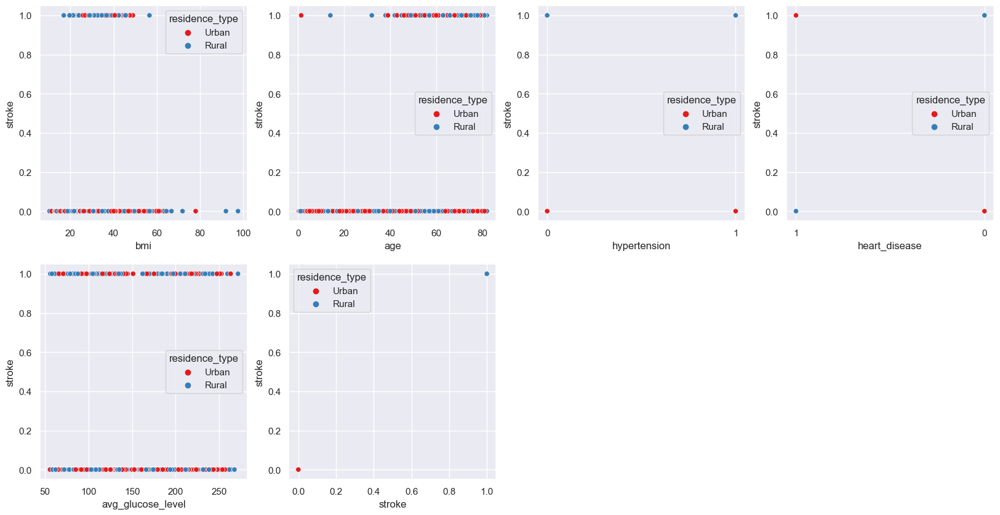

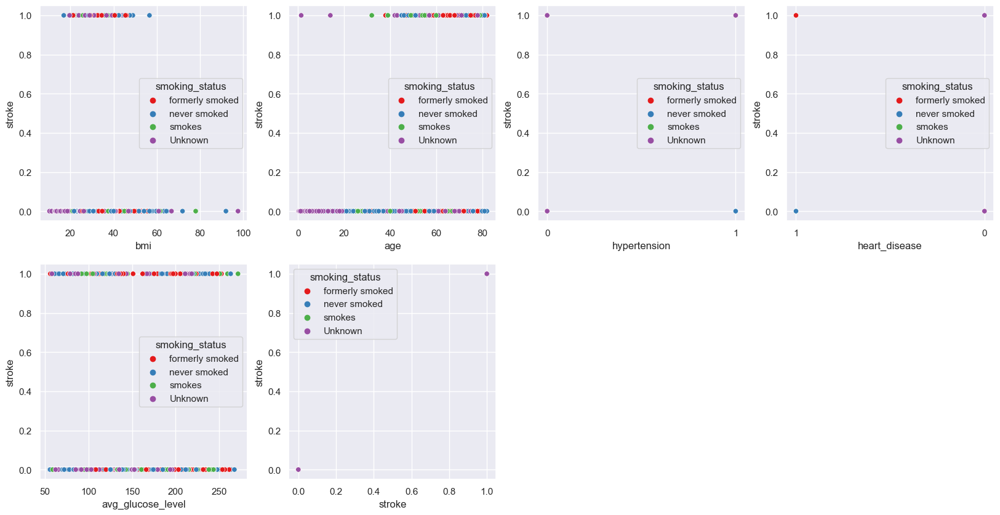

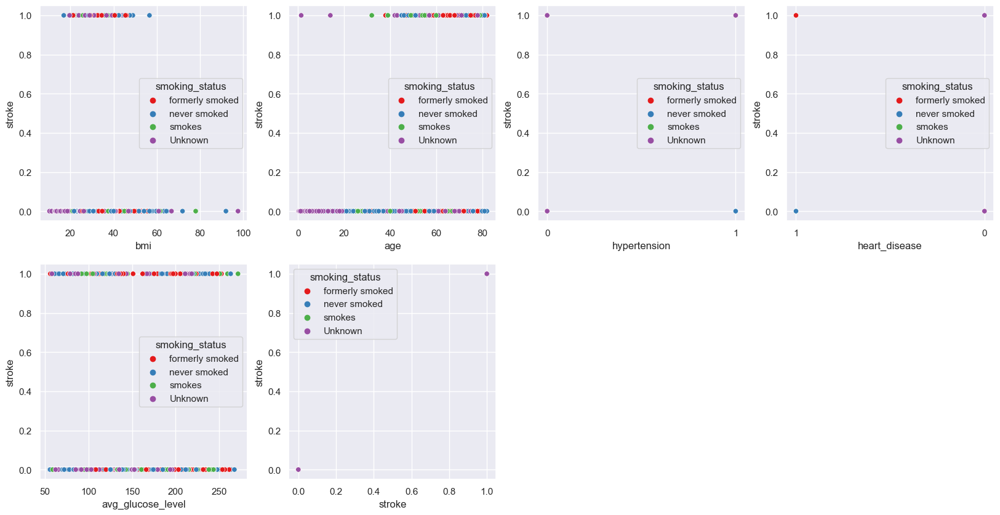

In [69]:
# Plot categorical and numerical columns together
tmp_df = Health_Data_Imputed_New.copy()
cat_df = tmp_df[cat_cols_New]
num_df = tmp_df[num_cols_New]
n = len(num_cols_New)
cols = 4
rows = (n + cols - 1) // cols

# Create main figure
path = report_path + 'relationship_scatter//'
if not os.path.exists(path):
    os.mkdir(path)

fig = plt.figure(1, figsize=(20,10))
for cat_col in cat_df:
    plt.clf()
    for k, col in zip(range(n), num_df):
        # add every single subplot to the figure with a for loop
        ax = fig.add_subplot(rows,cols,pos[k])
        sns.scatterplot(data=tmp_df, x=tmp_df[col], y=target, hue=tmp_df[cat_col], ax=ax, palette="Set1")
    # end for
    display(fig)
    filename = path+'scatter'+'_'+cat_col
    plt.savefig(filename)
# end for

<div class="alert alert-block alert-danger">
    <em><b>Insights/Remarks :</b></em>
    <br>
    <div class="alert alert-block alert-danger">
    <em><b>Data Insights :</b></em>
         <br>
        1) Males with a BMI between 20 and 50 are at risk of having a heart attack. 
        <br>
2) People over the age of 40 are more likely to have a heart attack.
        <br>
3) People who have married and have a BMI between 20 and 60 are at risk of having a heart attack.
        <br>
4) People over the age of 40 who smoke or used to smoke are more likely to have a heart attack.
    </div>
    <div class="alert alert-block alert-danger">
    <em><b>Health Insights :</b></em>
      
</div>

<div class="alert alert-block alert-info">
    <b><em>Guidelines :</em></b>
    <br>
    A bar graph or bar chart consists of multiple bars displaying different categories. A bar can be horizontal or vertical. Usually, a vertical bar graph is called a column chart or column graph. It is used compare different categories of entities to review their growth and performance.
</div>

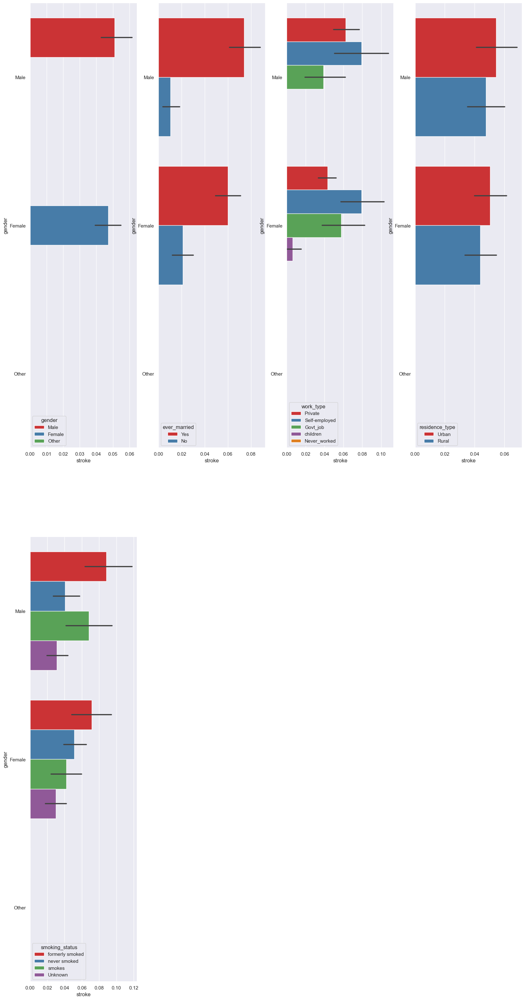

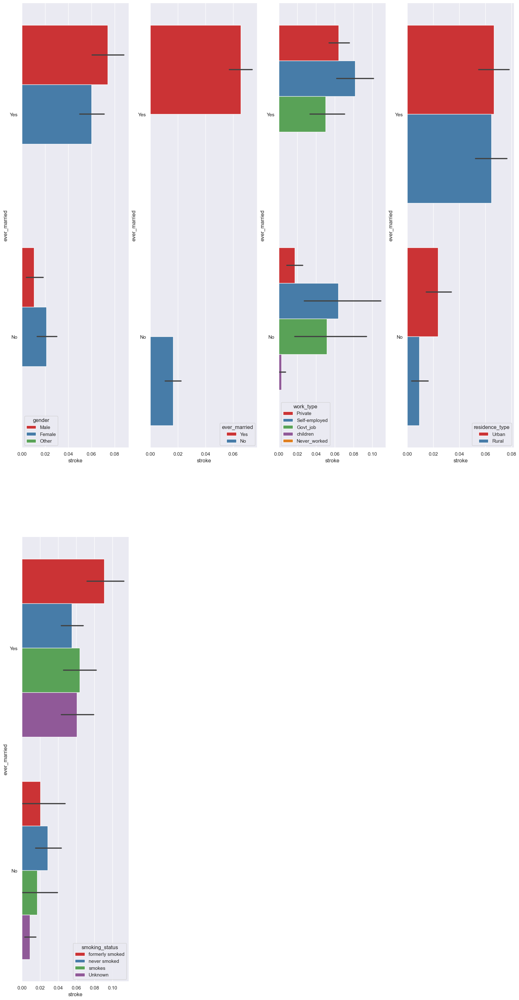

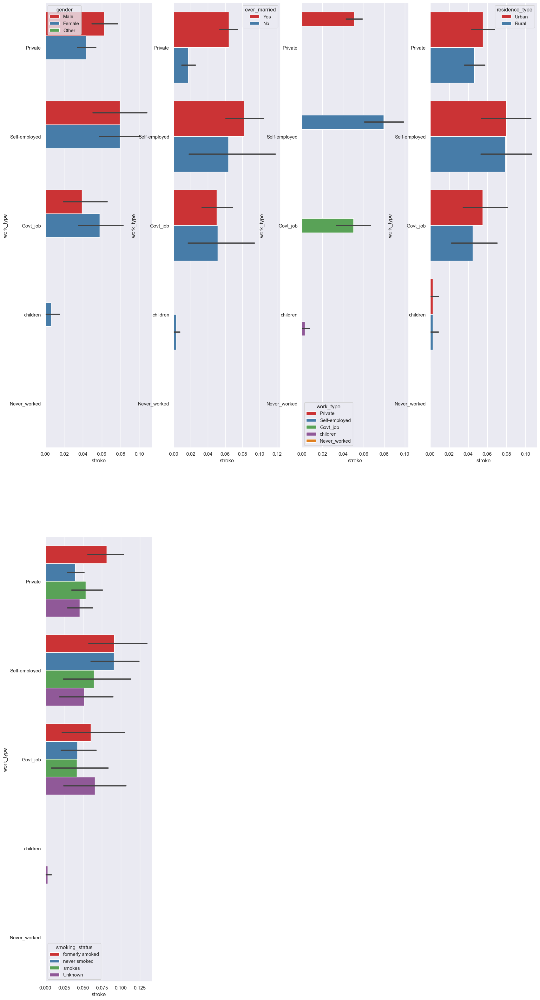

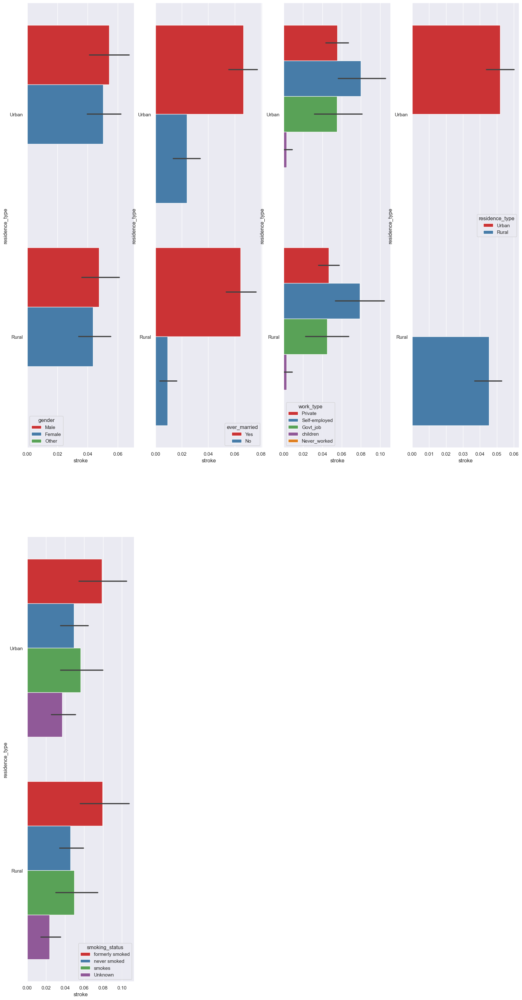

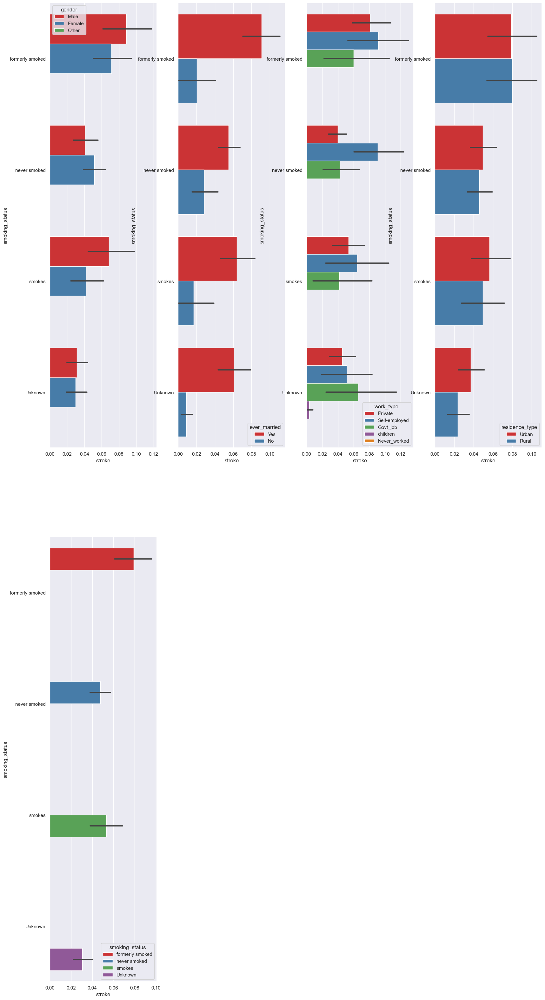

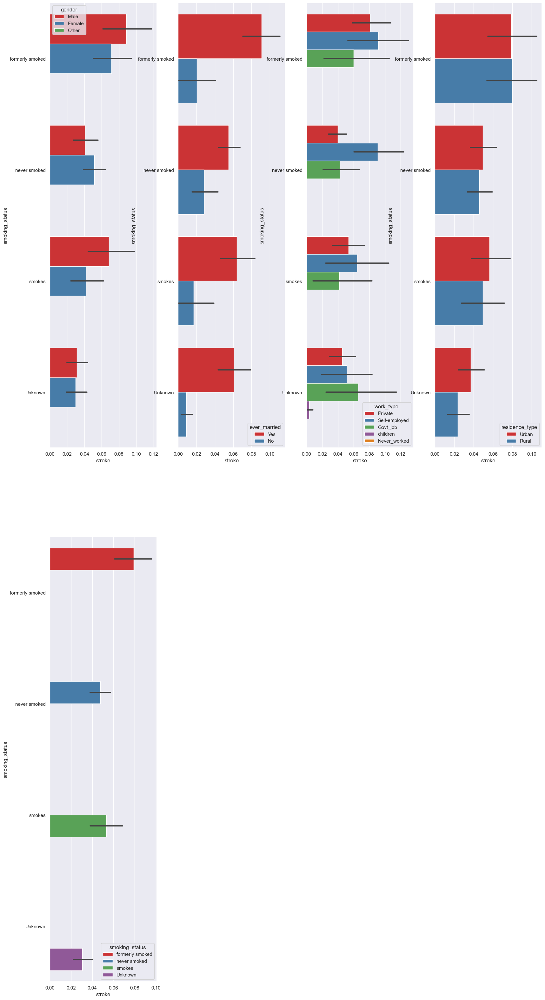

In [70]:
# Plot two categorical columns together wrt target
tmp_df = Health_Data_Imputed_New.copy()
cat_df = tmp_df[cat_cols_New]
num_df = tmp_df[num_cols_New]
n = len(cat_cols_New)
cols = 4
rows = (n + cols - 1) // cols

# Create main figure
path = report_path + 'relationship_multibar//'
if not os.path.exists(path):
    os.mkdir(path)

fig = plt.figure(1, figsize=(20,40))
for cat_col in cat_df[1:]:
    plt.clf()
    for k, col in enumerate(cat_df):
        # add every single subplot to the figure with a for loop
        ax = fig.add_subplot(rows,cols,pos[k])
        sns.barplot(data=tmp_df, y=tmp_df[cat_col], x=target, hue=tmp_df[col], ax=ax, palette="Set1", orient='h')
    # end for  
    display(fig)
    filename = path+'multi_bar'+'_'+col+'_'+cat_col
    plt.savefig(filename)
# end for

<div class="alert alert-block alert-danger">
    <em><b>Insights/Remarks :</b></em>
    <br>
    <div class="alert alert-block alert-danger">
    <em><b>Data Insights :</b></em>
    <br>
   1) When compared to other categories, the majority of males and females have formerly smoked.
        <br>
2) The majority of the women and men are married.
        <br>
3) The majority of both men and women are self-employed. They are more likely to suffer a heart attack.
        <br>
4) Women who are married have a higher risk of heart attack than men.
    </div>
    <div class="alert alert-block alert-danger">
    <em><b>Health Insights :</b></em>   
    </div>    
</div>

## 8 Composition - Part to Whole Relationship for each variable (static view)

<div class="alert alert-block alert-warning">
    <div class="alert alert-block alert-warning">
        <b><em>Why:</em></b>
        <br>
       The part-to-whole relationship helps to understand the proportions of the data in order to inform feature engineering decisions such as aggregating categories (if the cardinality of categories is high) and modeling decisions (such as how to handle imbalanced classes)
    </div>
    <div class="alert alert-block alert-warning">
        <b><em>Insights:</em></b>
        <br>
        Understand important patterns in the data, such as high cardinality, dominance of one category over others or an imbalance in the distribution of the data
    </div>
</div>

<div class="alert alert-block alert-info">
    <b><em>Guidelines :</em></b>
    <br>
    A similar insight could be gained as seen earlier in the countplot, but just as part of a whole using pie chart.
</div>

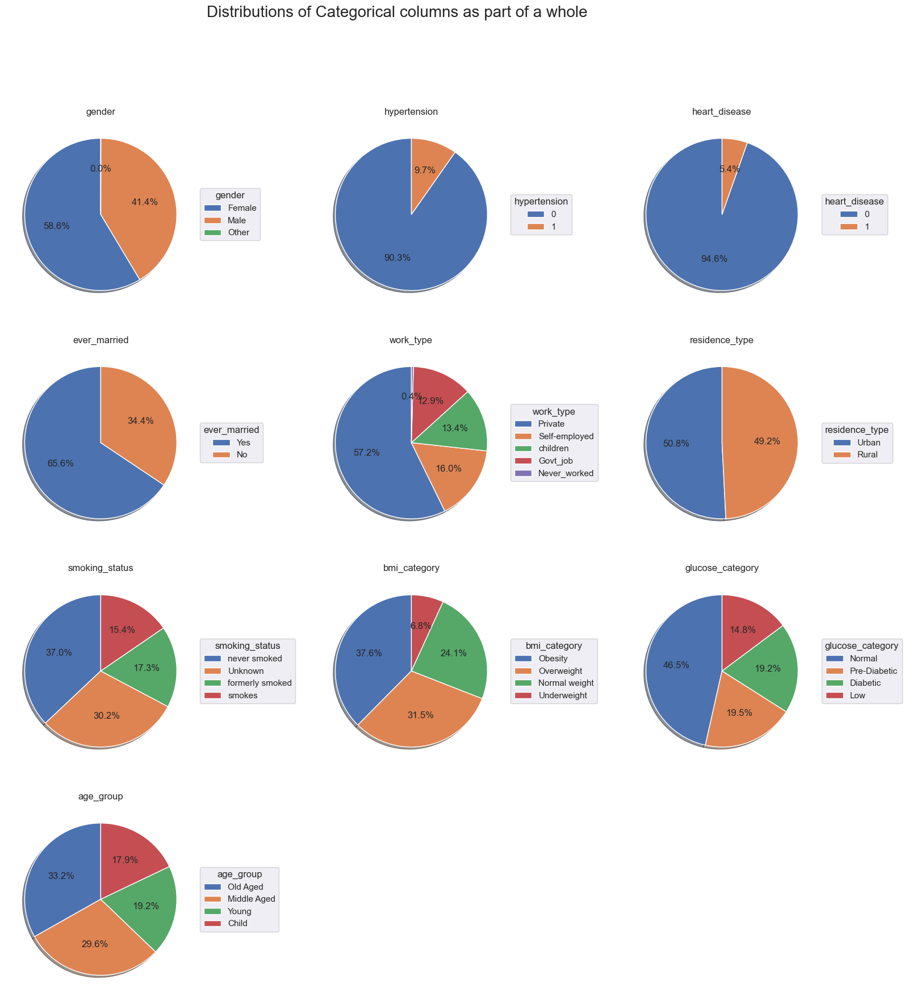

In [71]:
# Check distribution of Categorical variables

tmp_df = Health_Data_Final[cat_cols1]
n = len(cat_cols1)
if n/2 == 0: # even number
    cols = 4
    rows = int(n/cols)
elif n%3 == 0:   # odd number
    cols = 3
    rows = int(n/cols)
else: # not divisible
    cols = 3
    rows = int(n/cols) + 1
# end if

# Create a Position index
pos = range(1,n + 1)

# Create main figure

fig = plt.figure(1, figsize=(20,20))
for k, col in zip(range(n), tmp_df):
    # add every single subplot to the figure with a for loop
    ax = fig.add_subplot(rows,cols,pos[k])
    ax.pie(Health_Data_Final[col].value_counts(dropna=False), autopct='%1.1f%%',shadow=True, startangle=90)
    ax.legend(labels = Health_Data_Final[col].value_counts(dropna=False).index, loc ='center left', bbox_to_anchor=(1, 0.5), title=col,frameon = True)
    ax.set_title(col)
# end for
plt.suptitle("Distributions of Categorical columns as part of a whole", fontsize=20)
plt.show()

<div class="alert alert-block alert-danger">
    <em><b>Insights/Remarks :</b></em>
    <br>
    <div class="alert alert-block alert-danger">
        <em><b>Data Insights :</b></em>
        <br>
        The categories in each variable are unbalanced. Only the Gender,residence type and ever_married variables has a balance in the categories.
    </div>
    <div class="alert alert-block alert-danger">
        <em><b>Health Insights :</b></em>
        <br>
        None
    </div>    
</div>

## 9 Spplementary EDA

In [72]:
plt.style.use("fivethirtyeight")

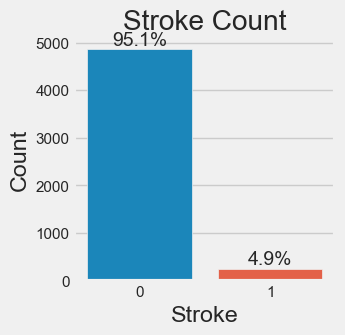

In [73]:
plt.figure(figsize=(3, 3))
ax = sns.countplot(x=Health_Data.stroke, data=Health_Data)
ax.set_ylabel("Count")
ax.set_xlabel("Stroke")
ax.set_title("Stroke Count")

# Add percentage text on top of each bar
total = len(Health_Data)
for p in ax.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height() / total)
    x = p.get_x() + p.get_width() / 2
    y = p.get_height()
    ax.annotate(percentage, (x, y), ha='center', va='bottom')

plt.show()

<div class="alert alert-block alert-danger">
    <em><b>Insights/Remarks :</b></em>
    <br>
    <div class="alert alert-block alert-danger">
        <em><b>Data Insights :</b></em>
        <br>
        1) The count of stroke is 249 which is 4.9%
    </div>
    <div class="alert alert-block alert-danger">
        <em><b>Health Insights :</b></em>
        <br>
        None
    </div>    
</div>

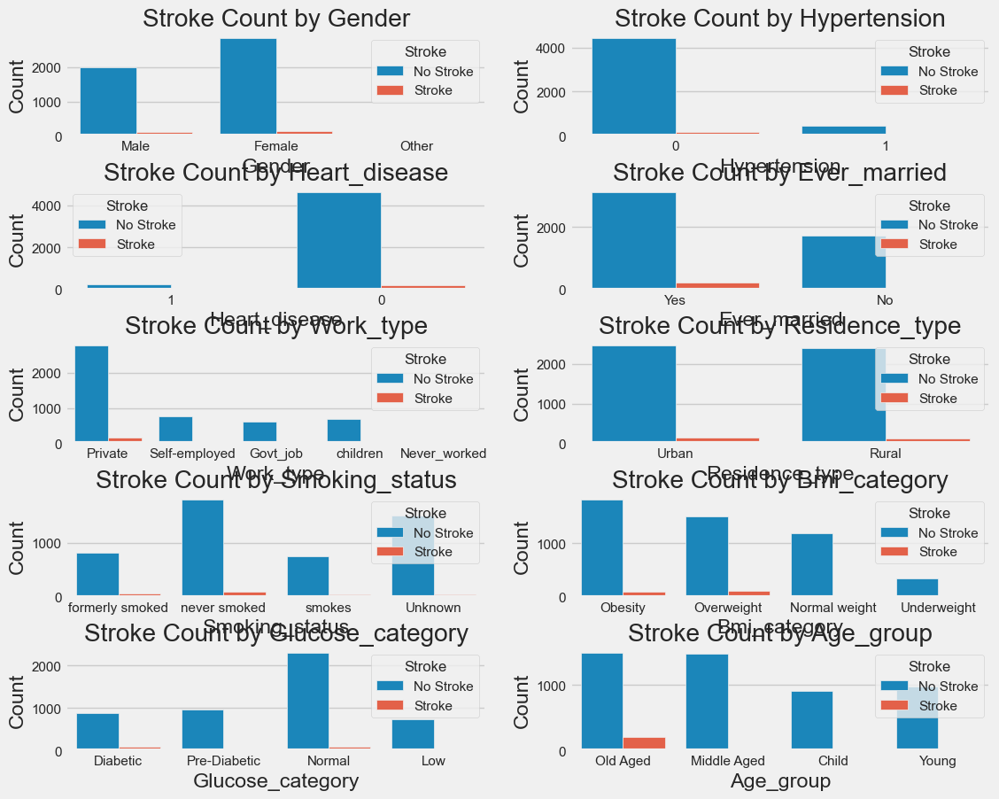

In [77]:
categorical_vars = Health_Data_Final.select_dtypes(include=['object']).columns
num_cols = 2
num_plots = len(categorical_vars)
num_rows = (num_plots + 1) // num_cols

fig, axes = plt.subplots(num_rows, num_cols, figsize=(12, 10))
fig.subplots_adjust(hspace=0.5)  # Adjust the vertical gap between rows

for i, var in enumerate(categorical_vars):
    row = i // num_cols
    col = i % num_cols
    ax = axes[row, col]
    sns.countplot(x=var, data=Health_Data_Final, hue='stroke', ax=ax)
    ax.set_xlabel(var.capitalize())
    ax.set_ylabel('Count')
    ax.set_title(f'Stroke Count by {var.capitalize()}')
    ax.legend(title='Stroke', labels=['No Stroke', 'Stroke'])

# Remove empty subplot if the number of plots is odd
if num_plots % 2 != 0:
    fig.delaxes(axes[-1, -1])

plt.show()


<div class="alert alert-block alert-danger">
    <em><b>Insights/Remarks :</b></em>
    <br>
    <div class="alert alert-block alert-danger">
        <em><b>Data Insights :</b></em>
        <br>
        1) Females are more susceptible to heart attacks than males.
        <br>
2) Married folks have more strokes than unmarried people.
        <br>
3) People who work in the private sector are more likely to suffer from a heart attack.
        <br>
4) The number of heart attacks in rural and urban areas is roughly equal. However, the urban population is slightly higher.
        <br>
5) People who are overweight or obese have a higher risk of having a stroke.
        <br>
6) The majority of heart attacks occur in the elderly.
    </div>
    <div class="alert alert-block alert-danger">
        <em><b>Health Insights :</b></em>
        <br>
        1) Married people tend to be older than other people, which makes them more susceptible to strokes.
        <br>
        2) People who are private will have greater work-related stress and less activity, which might result in hypertension.
        <br>
        3) People in metropolitan areas have slightly different daily routines than those in rural ones.
        <br>
        4) Older people will experience more medical complications than younger people.
    </div>    
</div>

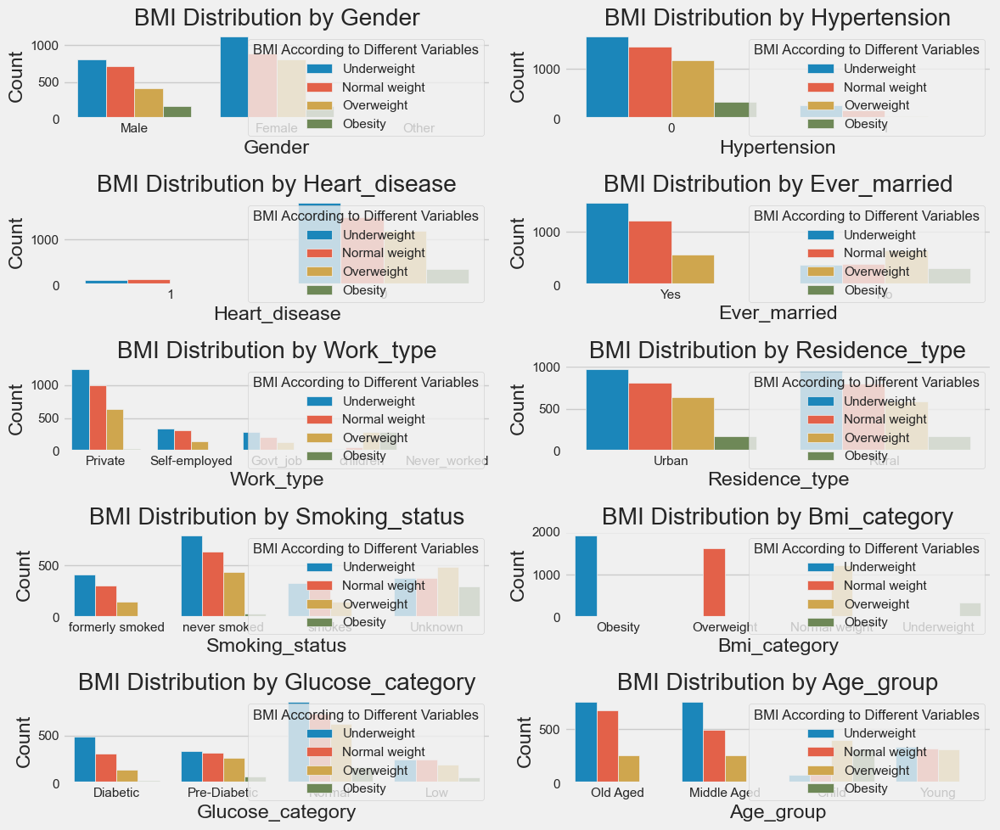

In [78]:

categorical_vars = Health_Data_Final.select_dtypes(include=['object']).columns
num_cols = 2
num_plots = len(categorical_vars)
num_rows = (num_plots + 1) // num_cols

fig, axes = plt.subplots(num_rows, num_cols, figsize=(12, 10))
fig.subplots_adjust(hspace=0.5)  # Adjust the vertical gap between rows

for i, var in enumerate(categorical_vars):
    row = i // num_cols
    col = i % num_cols
    ax = axes[row, col]
    sns.countplot(x=var, data=Health_Data_Final, hue='bmi_category', ax=ax)
    ax.set_xlabel(var.capitalize())
    ax.set_ylabel('Count')
    ax.set_title(f'BMI Distribution by {var.capitalize()}')
    ax.legend(title='BMI According to Different Variables', labels=['Underweight', 'Normal weight', 'Overweight', 'Obesity'], loc='upper right')

# Remove empty subplot if the number of plots is odd
if num_plots % 2 != 0:
    fig.delaxes(axes[-1, -1])

plt.tight_layout()  # Adjust spacing between subplots
plt.show()


<div class="alert alert-block alert-danger">
    <em><b>Insights/Remarks :</b></em>
    <br>
    <div class="alert alert-block alert-danger">
        <em><b>Data Insights :</b></em>
        <br>   
        1) The majority of diabetics are underweight or of normal weight.
        <br>
        2) The majority of middle-aged and elderly persons are underweight or of normal weight.
    </div>
    <div class="alert alert-block alert-danger">
        <em><b>Health Insights :</b></em>
        <br>   
        1) Diabetes patients will take additional steps to keep their weight under control.
        <br>
        2) The elderly and middle-aged will experience increased medical issues. In order to maintain good health and body weights, they must keep nutritious diets and engage in exercise.
    </div>    
</div>

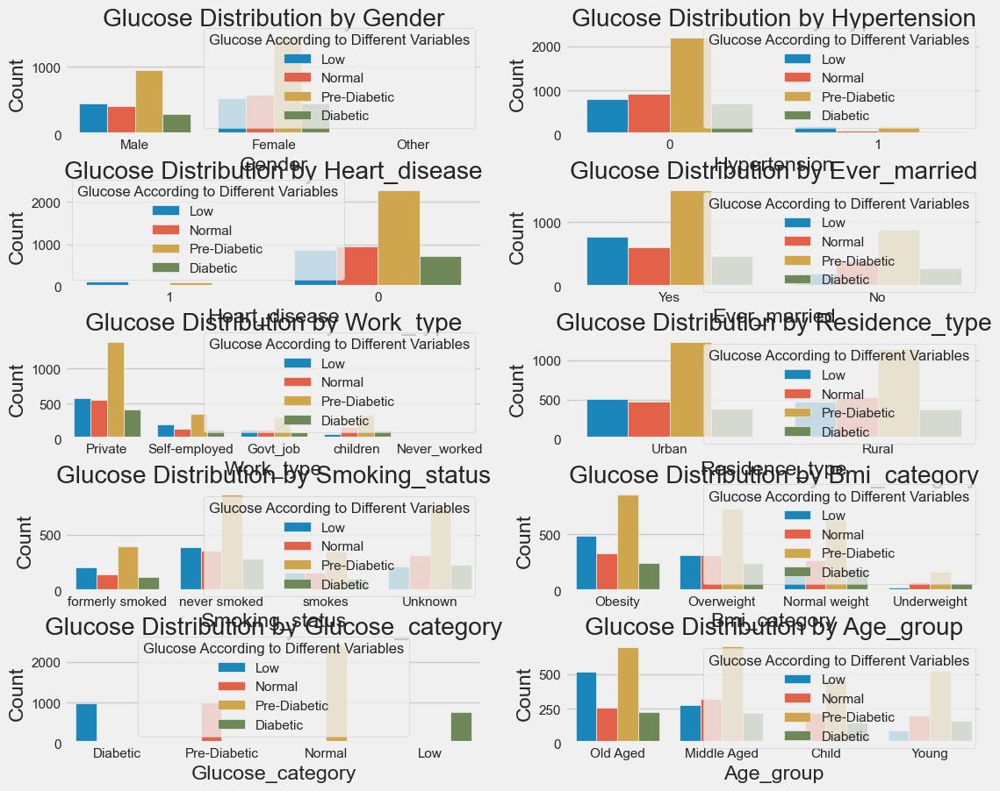

In [79]:
categorical_vars = Health_Data_Final.select_dtypes(include=['object']).columns
num_cols = 2
num_rows = (num_plots + 1) // num_cols

fig, axes = plt.subplots(num_rows, num_cols, figsize=(12, 10))
fig.subplots_adjust(hspace=0.5)  # Adjust the vertical gap between rows

for i, var in enumerate(categorical_vars):
    row = i // num_cols
    col = i % num_cols
    ax = axes[row, col]
    sns.countplot(x=var, data=Health_Data_Final, hue='glucose_category', ax=ax)
    ax.set_xlabel(var.capitalize())
    ax.set_ylabel('Count')
    ax.set_title(f'Glucose Distribution by {var.capitalize()}')
    ax.legend(title='Glucose According to Different Variables', labels=['Low', 'Normal', 'Pre-Diabetic', 'Diabetic'])

# Remove empty subplot if the number of plots is odd
if num_plots % 2 != 0:
    fig.delaxes(axes[-1, -1])

plt.show()

<div class="alert alert-block alert-danger">
    <em><b>Insights/Remarks :</b></em>
    <br>
    <div class="alert alert-block alert-danger">
        <em><b>Data Insights :</b></em>
        <br> 
        1)When compared to other divisions of Average Glucose Levels, Pre Diabetes is more prevalent across all age groups.
        <br>
        2) The prevalence of pre- and diabetes among non-smokers is higher.
        <br>
3) Obese and overweight people are more likely than others to have pre-diabetes and diabetes.
        <br>
        4) Every category in age has diabetics and pre Diabetics.
    </div>
    <div class="alert alert-block alert-danger">
        <em><b>Health Insights :</b></em>
        <br>
       1) Since average glucose levels are high across all age groups, other factors must be considered in order to accurately predict heart attacks.
        <br>    
    </div>    
</div>

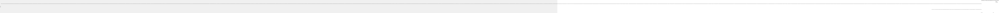

In [82]:
import matplotlib.pyplot as plt
import seaborn as sns
# Select the columns of interest
comparison_cols = ['hypertension', 'heart_disease']

# Group the data by "stroke" column and calculate the counts for each category
grouped_data = Health_Data_Final.groupby('stroke')[comparison_cols].sum()

# Reset the index of the grouped data
grouped_data = grouped_data.reset_index()

# Set the width of each bar
bar_width = 0.35

# Set the positions of the bars on the x-axis
r1 = [0, 1]
r2 = [x + bar_width for x in r1]

# Create the figure and axes
fig, ax = plt.subplots(figsize=(8, 6))

# Plot the bars for "hypertension" (colored in red)
sns.barplot(x=r1, y=grouped_data['hypertension'], color='red', ax=ax, label='Hypertension')

# Plot the bars for "heart_disease" (colored in blue)
sns.barplot(x=r2, y=grouped_data['heart_disease'], color='blue', ax=ax, label='Heart Disease')

# Set the x-axis labels
ax.set_xticks([0, 1])
ax.set_xticklabels(['No Stroke', 'Stroke'])

# Set the y-axis label and plot title
ax.set_ylabel('Count')
ax.set_title('Comparison of Stroke with Hypertension and Heart Disease')

# Add a legend
ax.legend(title='Variables')

# Show the plot
plt.show()

<div class="alert alert-block alert-danger">
    <em><b>Insights/Remarks :</b></em>
    <br>
    <div class="alert alert-block alert-danger">
        <em><b>Data Insights :</b></em>
        <br> 
        1) The people having heart disease are more proned to get stroke compared hypertension.
    </div>
    <div class="alert alert-block alert-danger">
        <em><b>Health Insights :</b></em>
        <br>
        <br>    
    </div>    
</div>

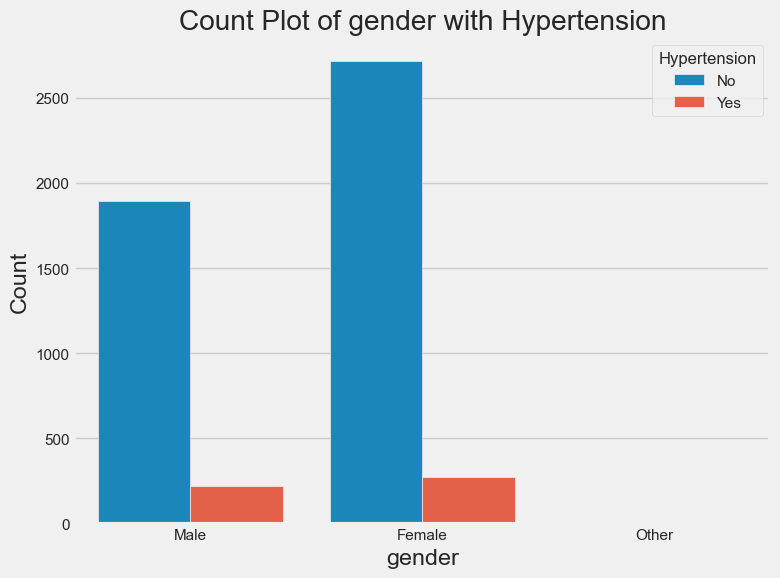

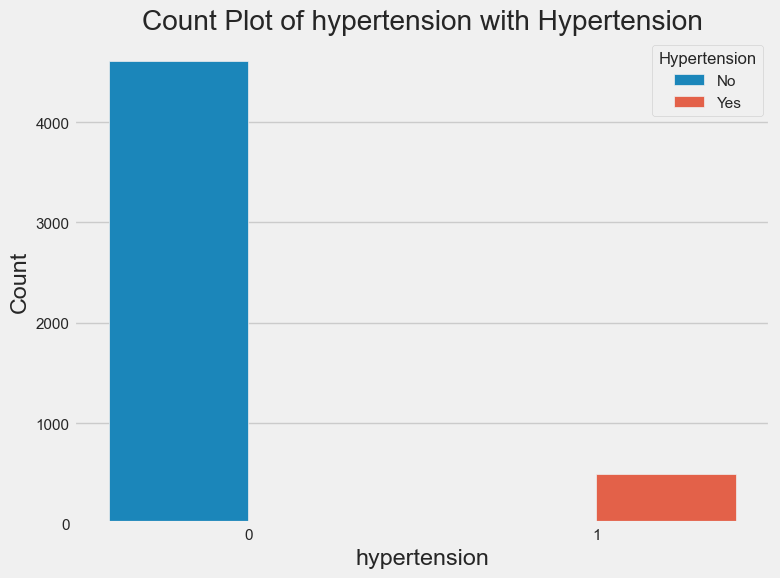

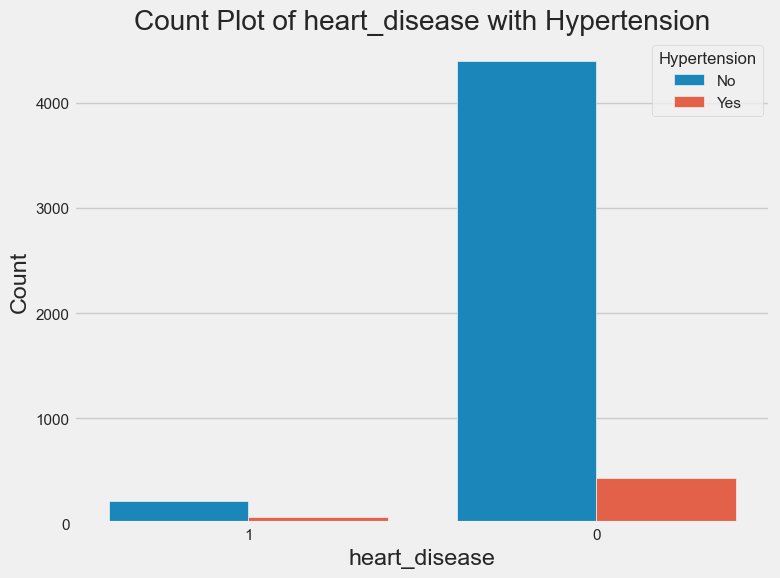

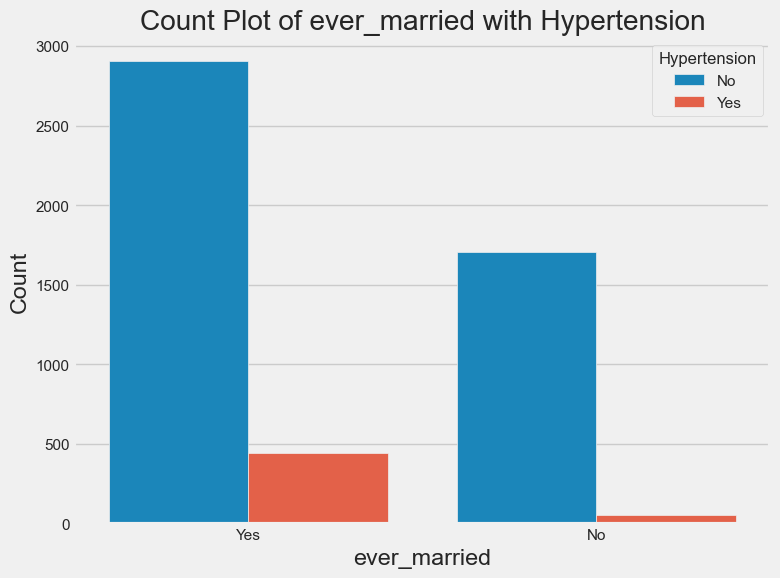

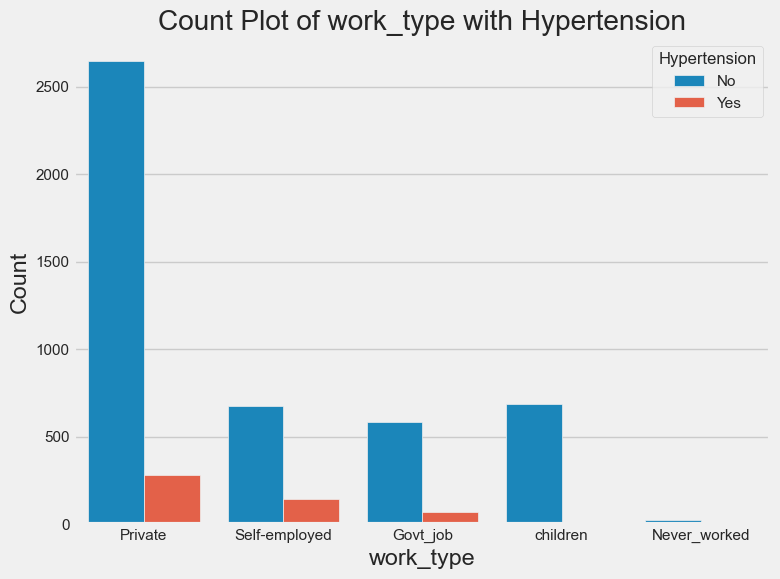

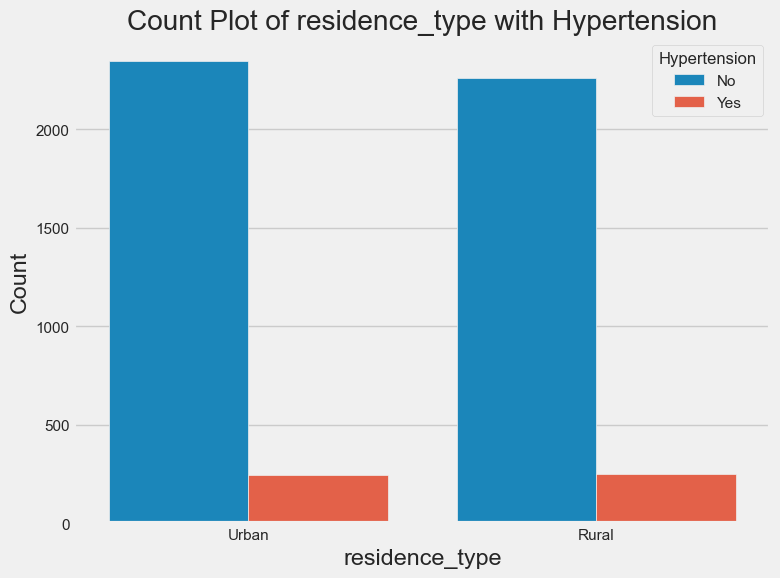

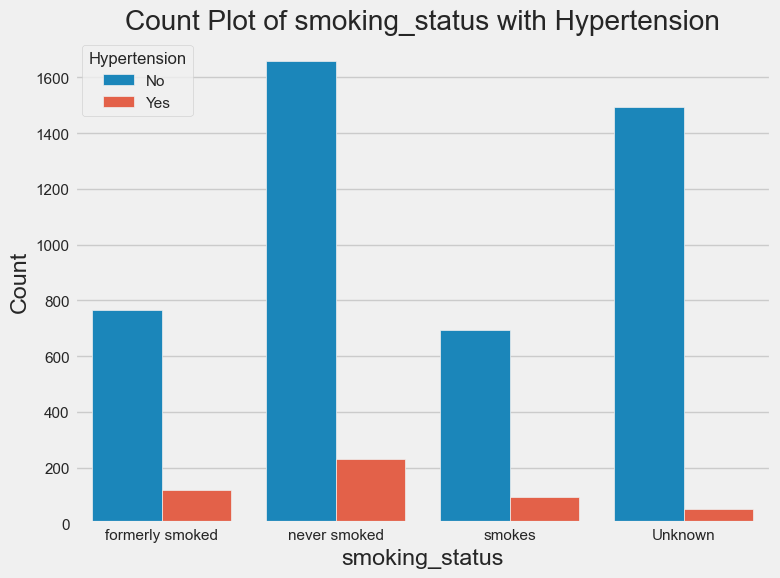

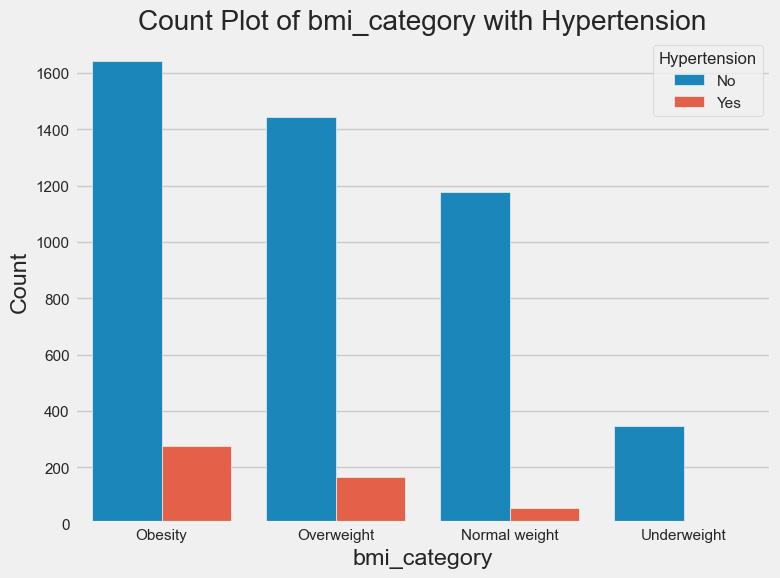

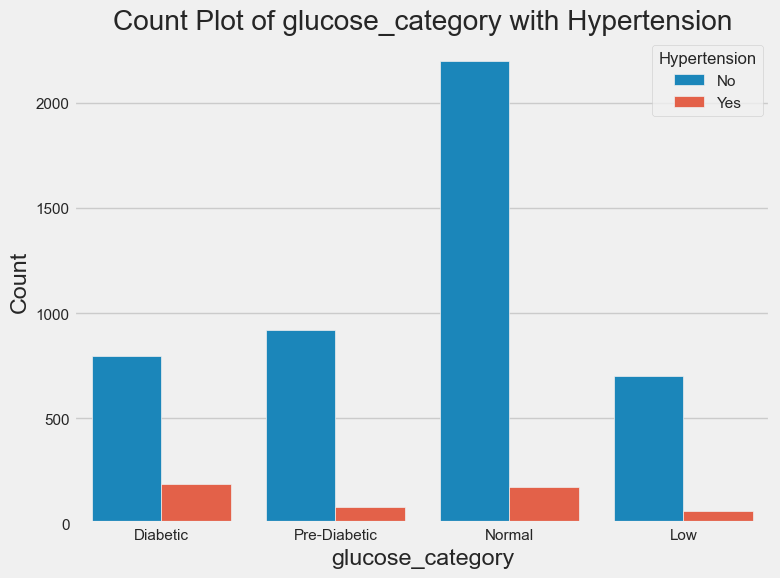

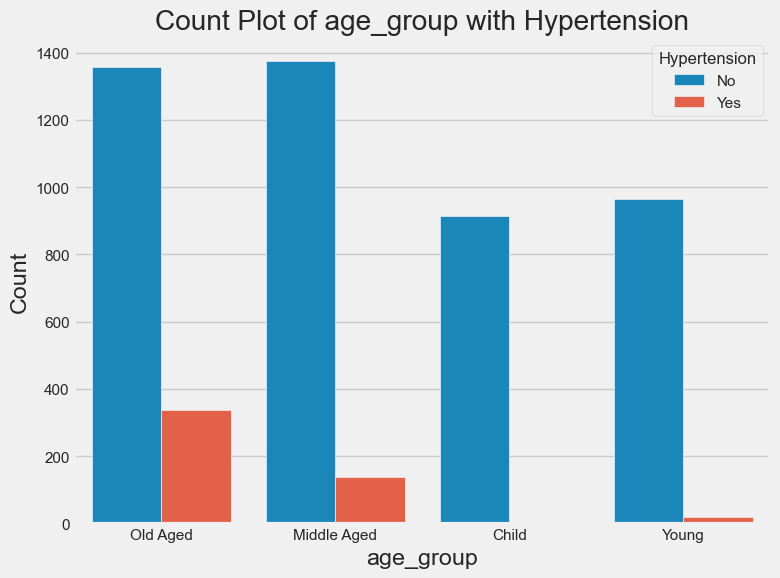

In [84]:
import matplotlib.pyplot as plt
import seaborn as sns

object_cols = Health_Data_Final.select_dtypes(include=['object']).columns

# Plot count plots for each object column
for col in object_cols:
    plt.figure(figsize=(8, 6))
    sns.countplot(data=Health_Data_Final, x=col, hue='hypertension', hue_order=['0', '1'])
    plt.title(f'Count Plot of {col} with Hypertension')
    plt.xlabel(col)
    plt.ylabel('Count')
    plt.legend(title='Hypertension', labels=['No', 'Yes'])
    plt.show()


<div class="alert alert-block alert-danger">
    <em><b>Insights/Remarks :</b></em>
    <br>
    <div class="alert alert-block alert-danger">
        <em><b>Data Insights :</b></em>
        <br> 
        1) Hypertension affects older and middle-aged adults more frequently.
        <br>
        2) People with diabetes are more likely to experience hypertension.
        <br>
        3) Obese and overweight people are more likely to develop hypertension.
        <br>
        4) People who have never smoked are more prone to hypertension.
    </div>
    <div class="alert alert-block alert-danger">
        <em><b>Health Insights :</b></em>
        <br>
        1) Hypertension is one of the risk factors for heart attack.
        <br>
        2) Hypertension is more likely to occur in those who have diabetes, are overweight or obese, are elderly or middle-aged. 
        <br>
        3) People who have never smoked have hypertension since smoking decreases tension to some extent. They can, however, develop consequences other than hypertension.
        <br>    
    </div>    
</div>

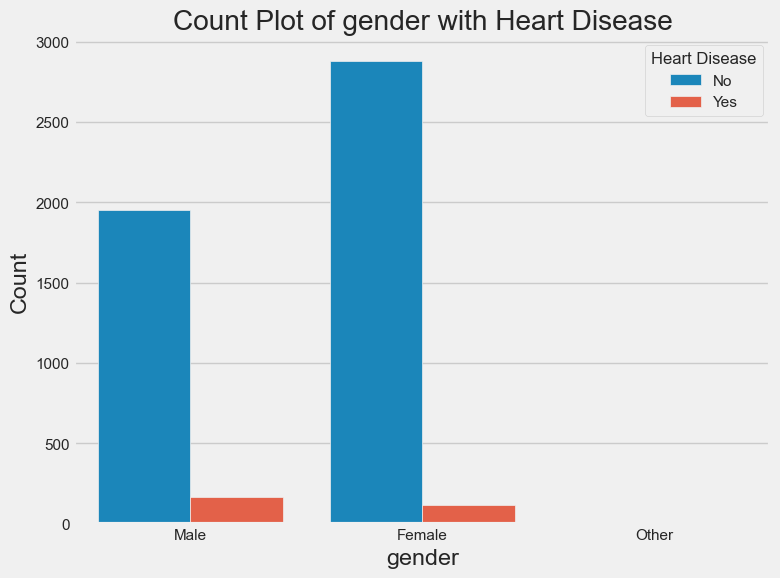

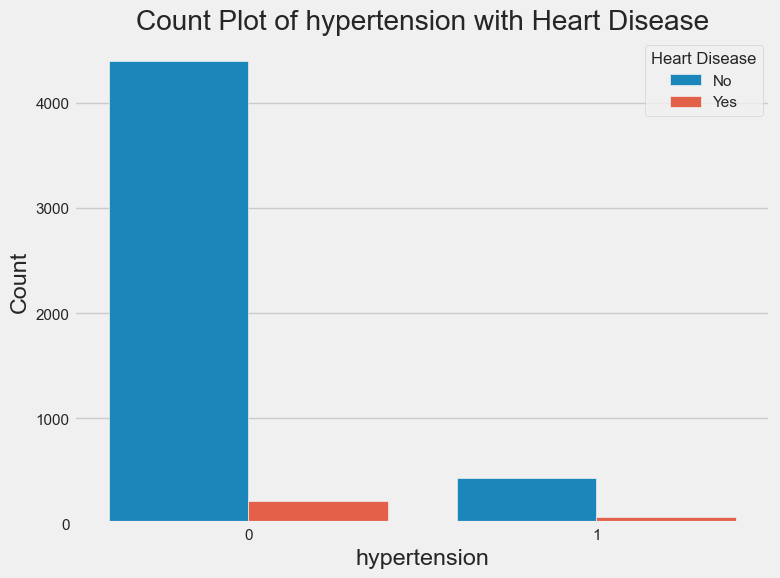

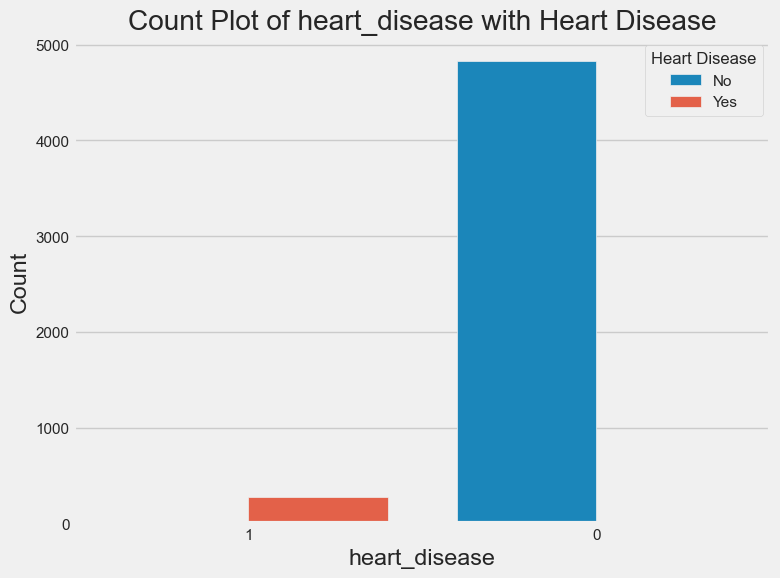

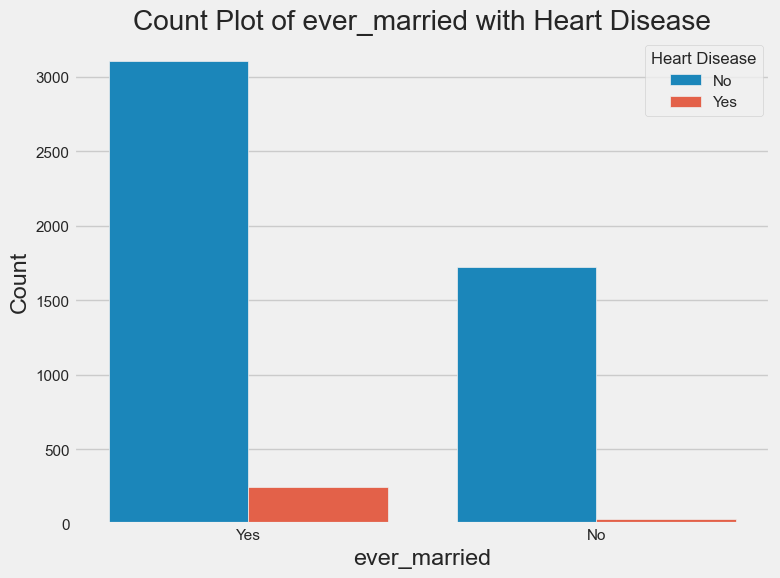

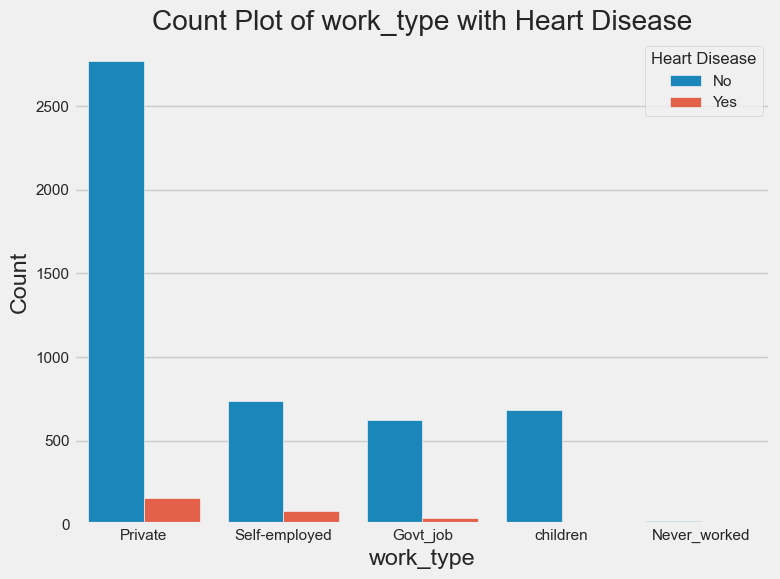

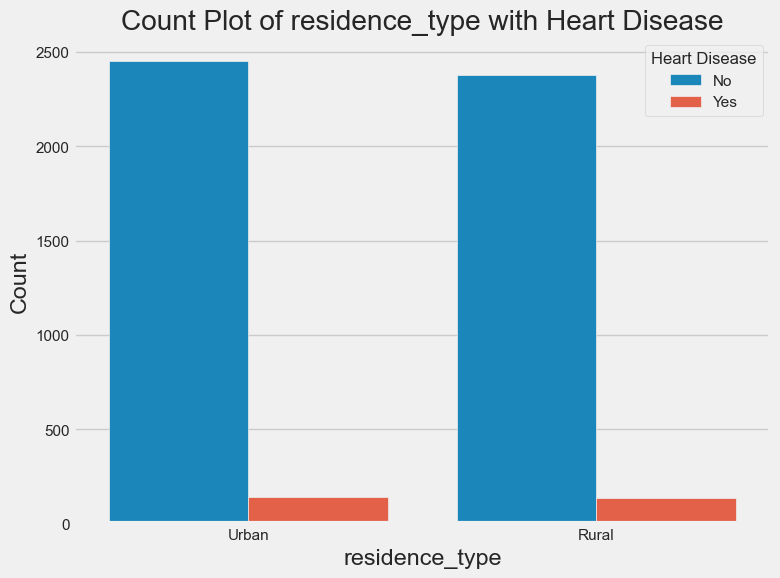

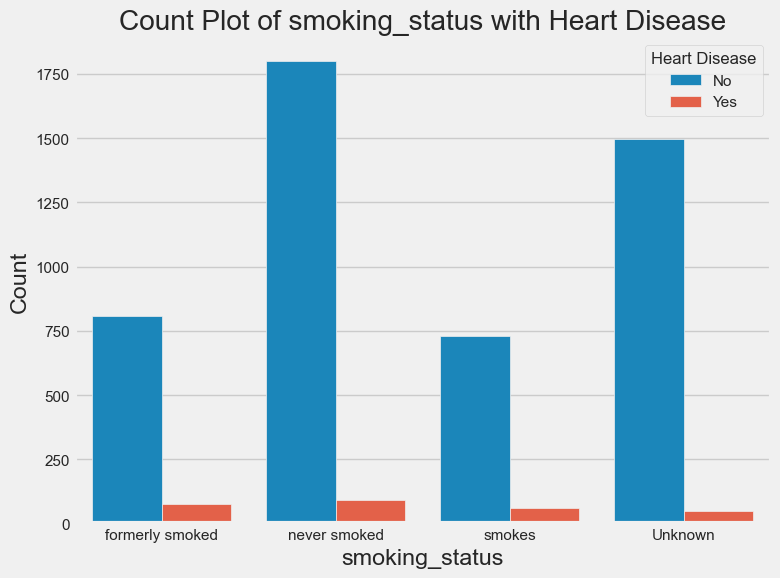

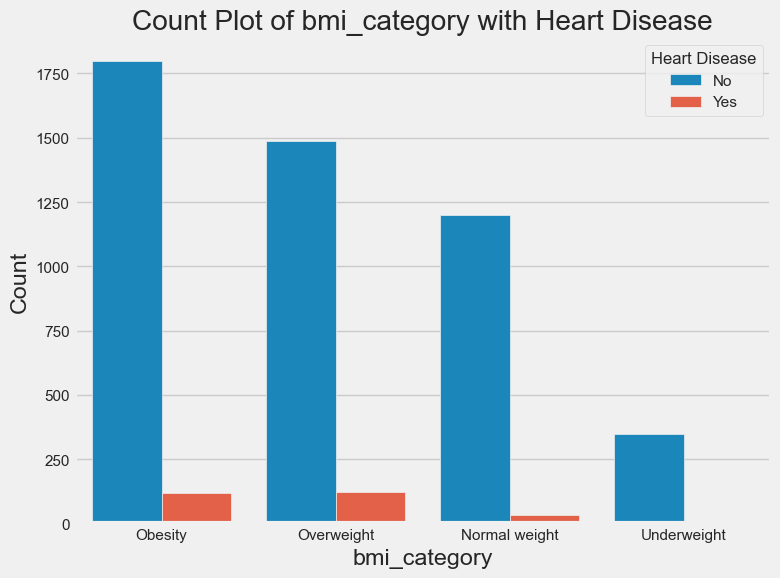

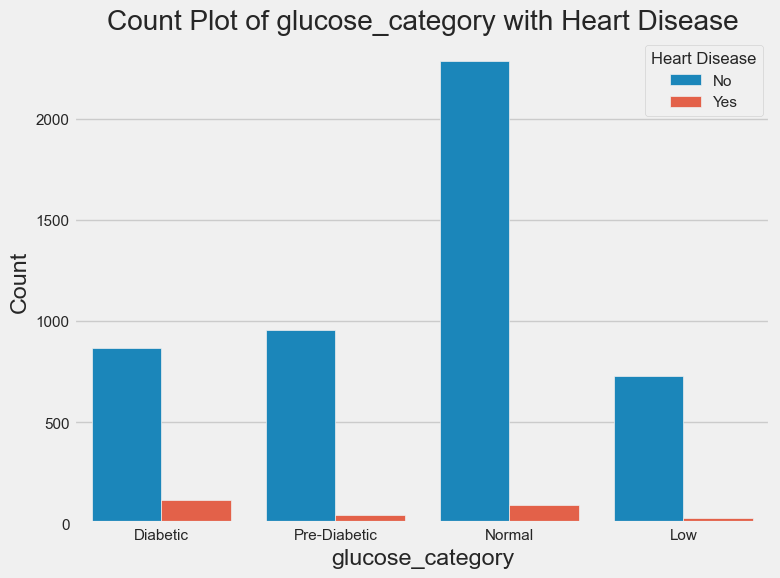

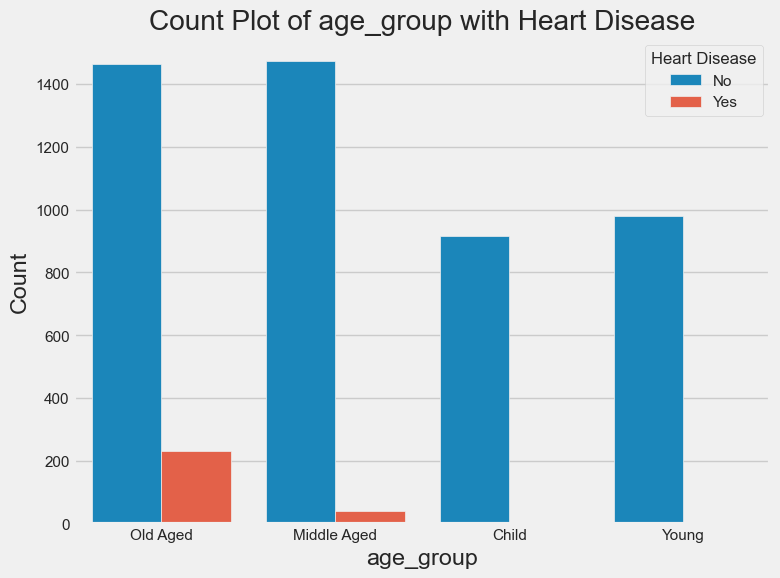

In [86]:
import matplotlib.pyplot as plt
import seaborn as sns

object_cols = Health_Data_Final.select_dtypes(include=['object']).columns

# Plot count plots for each object column
for col in object_cols:
    plt.figure(figsize=(8, 6))
    sns.countplot(data=Health_Data_Final, x=col, hue='heart_disease', hue_order=['0', '1'])
    plt.title(f'Count Plot of {col} with Heart Disease')
    plt.xlabel(col)
    plt.ylabel('Count')
    plt.legend(title='Heart Disease', labels=['No', 'Yes'])
    plt.show()



<div class="alert alert-block alert-danger">
    <em><b>Insights/Remarks :</b></em>
    <br>
    <div class="alert alert-block alert-danger">
        <em><b>Data Insights :</b></em>
        <br> 
       1) People who have never smoked have a higher risk of stroke than those who have previously smoked or who smoke.
    <br>
        2) Obese and overweight people have heart problems.
<br>
        3) Diabetics have a higher risk of heart disease than the general population.
    <br>
        4) Heart disease is most common in Old aged and muddle aged people.
    </div>
    <div class="alert alert-block alert-danger">
        <em><b>Health Insights :</b></em>
        <br>
        1) Strokes are most common in the elderly and middle-aged.
    </div>    
</div>

In [87]:
Health_Data_Final

,gender,hypertension,heart_disease,ever_married,work_type,residence_type,smoking_status,stroke,bmi_category,glucose_category,age_group
0,Male,0,1,Yes,Private,Urban,formerly smoked,1,Obesity,Diabetic,Old Aged
1,Female,0,0,Yes,Self-employed,Rural,never smoked,1,Overweight,Diabetic,Old Aged
2,Male,0,1,Yes,Private,Rural,never smoked,1,Obesity,Pre-Diabetic,Old Aged
3,Female,0,0,Yes,Private,Urban,smokes,1,Obesity,Diabetic,Middle Aged
4,Female,1,0,Yes,Self-employed,Rural,never smoked,1,Normal weight,Diabetic,Old Aged
...,...,...,...,...,...,...,...,...,...,...,...
5105,Female,1,0,Yes,Private,Urban,never smoked,0,Overweight,Normal,Old Aged
5106,Female,0,0,Yes,Self-employed,Urban,never smoked,0,Obesity,Pre-Diabetic,Old Aged
5107,Female,0,0,Yes,Self-employed,Rural,never smoked,0,Obesity,Normal,Young
5108,Male,0,0,Yes,Private,Rural,formerly smoked,0,Overweight,Diabetic,Middle Aged


In [88]:
stroke_records = Health_Data_Final[Health_Data_Final['stroke'] == 1]
stroke_records

,gender,hypertension,heart_disease,ever_married,work_type,residence_type,smoking_status,stroke,bmi_category,glucose_category,age_group
0,Male,0,1,Yes,Private,Urban,formerly smoked,1,Obesity,Diabetic,Old Aged
1,Female,0,0,Yes,Self-employed,Rural,never smoked,1,Overweight,Diabetic,Old Aged
2,Male,0,1,Yes,Private,Rural,never smoked,1,Obesity,Pre-Diabetic,Old Aged
3,Female,0,0,Yes,Private,Urban,smokes,1,Obesity,Diabetic,Middle Aged
4,Female,1,0,Yes,Self-employed,Rural,never smoked,1,Normal weight,Diabetic,Old Aged
...,...,...,...,...,...,...,...,...,...,...,...
244,Male,0,0,Yes,Private,Rural,Unknown,1,Obesity,Normal,Old Aged
245,Female,0,0,No,children,Rural,Unknown,1,Obesity,Low,Child
246,Female,0,0,Yes,Self-employed,Rural,formerly smoked,1,Overweight,Normal,Old Aged
247,Male,1,0,Yes,Self-employed,Rural,Unknown,1,Overweight,Normal,Old Aged


In [89]:
stroke_records_age = Health_Data_Final[(Health_Data_Final['age_group'] == 'Child') & (Health_Data_Final['stroke'] == 1)]
stroke_records_age

,gender,hypertension,heart_disease,ever_married,work_type,residence_type,smoking_status,stroke,bmi_category,glucose_category,age_group
162,Female,0,0,No,children,Urban,Unknown,1,Overweight,Normal,Child
245,Female,0,0,No,children,Rural,Unknown,1,Obesity,Low,Child


<div class="alert alert-block alert-danger">
    <em><b>Insights/Remarks :</b></em>
    <br>
    <div class="alert alert-block alert-danger">
        <em><b>Data Insights :</b></em>
        <br> 
        1) In entire data only two got proned to stroke who are child.    
    <div class="alert alert-block alert-danger">
        <em><b>Health Insights :</b></em>
        <br>
        1) The child who got stroke are overweight and Obese and they are female.      
</div>

In [90]:
stroke_records_age1 = Health_Data_Final[(Health_Data_Final['age_group'] == 'Young') & (Health_Data_Final['stroke'] == 1)]
stroke_records_age1

,gender,hypertension,heart_disease,ever_married,work_type,residence_type,smoking_status,stroke,bmi_category,glucose_category,age_group
182,Female,0,0,Yes,Private,Rural,smokes,1,Overweight,Normal,Young


<div class="alert alert-block alert-danger">
    <em><b>Insights/Remarks :</b></em>
    <br>
    <div class="alert alert-block alert-danger">
        <em><b>Data Insights :</b></em>
        <br> 
       1) In entire data only one got proned to stroke who are young.
    </div>
    <div class="alert alert-block alert-danger">
        <em><b>Health Insights :</b></em>
        <br>
       1) The person who is young got stroke is overweight and female.
    </div>    
</div>

In [91]:
stroke_records_age2 = Health_Data_Final[(Health_Data_Final['age_group'] == 'Middle Aged') & (Health_Data_Final['stroke'] == 1)]
stroke_records_age2

,gender,hypertension,heart_disease,ever_married,work_type,residence_type,smoking_status,stroke,bmi_category,glucose_category,age_group
3,Female,0,0,Yes,Private,Urban,smokes,1,Obesity,Diabetic,Middle Aged
12,Female,0,0,Yes,Private,Urban,smokes,1,Overweight,Pre-Diabetic,Middle Aged
15,Female,1,0,Yes,Self-employed,Rural,never smoked,1,Obesity,Diabetic,Middle Aged
21,Female,1,0,Yes,Self-employed,Urban,never smoked,1,Obesity,Diabetic,Middle Aged
31,Male,0,0,Yes,Private,Rural,Unknown,1,Overweight,Normal,Middle Aged
34,Male,0,0,No,Govt_job,Urban,never smoked,1,Overweight,Normal,Middle Aged
39,Female,0,0,Yes,Private,Urban,never smoked,1,Overweight,Low,Middle Aged
41,Male,0,0,Yes,Private,Urban,never smoked,1,Overweight,Normal,Middle Aged
49,Female,1,0,Yes,Private,Rural,smokes,1,Obesity,Low,Middle Aged
59,Female,1,0,Yes,Govt_job,Urban,never smoked,1,Overweight,Diabetic,Middle Aged


In [92]:
stroke_records_age2.shape

(36, 11)

In [93]:
value_counts_var1 = stroke_records_age2['bmi_category'].value_counts()
value_counts_var2 = stroke_records_age2['glucose_category'].value_counts()
value_counts_var3 = stroke_records_age2['gender'].value_counts()

print(value_counts_var1)
print(value_counts_var2)
print(value_counts_var3)

Obesity          18
Overweight       16
Normal weight     2
Name: bmi_category, dtype: int64
Normal          16
Diabetic         9
Pre-Diabetic     6
Low              5
Name: glucose_category, dtype: int64
Female    26
Male      10
Name: gender, dtype: int64


<div class="alert alert-block alert-danger">
    <em><b>Insights/Remarks :</b></em>
    <br>
    <div class="alert alert-block alert-danger">
        <em><b>Data Insights :</b></em>
        <br> 
       1) Most of the middle aged people who got stroke are either obese or Overweight.
    </div>
    <div class="alert alert-block alert-danger">
        <em><b>Health Insights :</b></em>
        <br>
       1) In this category also female are more likely to get stroke.
    </div>    
</div>

In [94]:
stroke_records_age3 = Health_Data_Final[(Health_Data_Final['age_group'] == 'Old Aged') & (Health_Data_Final['stroke'] == 1)]
stroke_records_age3

,gender,hypertension,heart_disease,ever_married,work_type,residence_type,smoking_status,stroke,bmi_category,glucose_category,age_group
0,Male,0,1,Yes,Private,Urban,formerly smoked,1,Obesity,Diabetic,Old Aged
1,Female,0,0,Yes,Self-employed,Rural,never smoked,1,Overweight,Diabetic,Old Aged
2,Male,0,1,Yes,Private,Rural,never smoked,1,Obesity,Pre-Diabetic,Old Aged
4,Female,1,0,Yes,Self-employed,Rural,never smoked,1,Normal weight,Diabetic,Old Aged
5,Male,0,0,Yes,Private,Urban,formerly smoked,1,Overweight,Diabetic,Old Aged
...,...,...,...,...,...,...,...,...,...,...,...
243,Female,1,1,Yes,Private,Urban,formerly smoked,1,Obesity,Diabetic,Old Aged
244,Male,0,0,Yes,Private,Rural,Unknown,1,Obesity,Normal,Old Aged
246,Female,0,0,Yes,Self-employed,Rural,formerly smoked,1,Overweight,Normal,Old Aged
247,Male,1,0,Yes,Self-employed,Rural,Unknown,1,Overweight,Normal,Old Aged


In [95]:
value_counts_var11 = stroke_records_age3['bmi_category'].value_counts()
value_counts_var22= stroke_records_age3['glucose_category'].value_counts()
value_counts_var33= stroke_records_age3['gender'].value_counts()

print(value_counts_var11)
print(value_counts_var22)
print(value_counts_var33)

Overweight       97
Obesity          79
Normal weight    33
Underweight       1
Name: bmi_category, dtype: int64
Diabetic        91
Normal          67
Pre-Diabetic    31
Low             21
Name: glucose_category, dtype: int64
Female    112
Male       98
Name: gender, dtype: int64


<div class="alert alert-block alert-danger">
    <em><b>Insights/Remarks :</b></em>
    <br>
    <div class="alert alert-block alert-danger">
        <em><b>Data Insights :</b></em>
        <br> 
       1) The people who are old aged who got stroke are most likely overweight or obese. 
    <div class="alert alert-block alert-danger">
        <em><b>Health Insights :</b></em>
        <br>
       1) Most of them are Females by gender.
    </div>    
</div>

## 10 Summary

<div class="alert alert-block alert-warning">
    <div class="alert alert-block alert-warning">
        <em><b>Why :</b></em>
        <br>
        To note down in one place, all the insights and take away 
    action items from the entire EDA exercise
    </div>
    <div class="alert alert-block alert-warning">
        <em><b>Insights :</b></em>
        <br>
        a) Key insights
        <br>
        b) Take aways for Feature engineering
    </div>
</div>

Key Highlights:
1. There are missing values in BMI column. Imputed the missing values using KNN imputation.
2. There are no Duplicates.
3. Onehot Encoding can be done on categorical columns and standard scaling can be done on numerical columns. 
4. Bmi, Age and Average Glucose was been converted in to different categories based on range for EDA Purpose.
5. The distribution of target variable in outlier data is twice the distribution of actual dataset.

## HEALTH INSIGHTS

<div class="alert alert-block alert-danger">
    <em><b>Insights/Remarks :</b></em>
    <br>
    <div class="alert alert-block alert-danger">
        <em><b>Health Insights :</b></em>
        <br>
     1) Females are more susceptible to heart attacks than males.
        <br>
 2) Married people tend to be older than other people, which makes them more susceptible to strokes.
        <br>
 3) People who are working as private Employes will have greater work-related stress and less activity, which might result in hypertension.
        <br>
 4) People who are overweight or obese have a higher risk of having a stroke.
        <br>
 5) Since average glucose levels are high across all age groups, other factors must be considered in order to accurately predict heart attacks.
        <br>
 6) The people having heart disease are more proned to get stroke compared hypertension.
        <br>
 7) Hreart Disease and Hypertension is one of the risk factors for heart attack.
        <br>
 8) Hypertension is more likely to occur in those who have diabetes, are overweight or obese, are elderly or middle-aged.
        <br>
 9) Strokes are most common in the elderly and middle-aged.
        <br>
10) The child who got stroke are overweight and Obese and they are female.
        <br>
 11) The person who is young got stroke is overweight and female.
        <br>
    12) Most of the middle aged people who got stroke are either obese or Overweight. Moreover they are mostly female.
        <br>
 13) The people who are old aged who got stroke are most likely overweight or obese. Other than that they are mostly Female.
    </div>    
</div>